In [0]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

# enter the foldername in your Drive where you have saved the unzipped
# 'cs231n' folder containing the '.py', 'classifiers' and 'datasets'
# folders.
# e.g. 'cs231n/assignments/assignment1/cs231n/'
FOLDERNAME = 'cs231n/assignments/cs231n/'

assert FOLDERNAME is not None, "[!] Enter the foldername."

%cd /content/drive/My\ Drive
%cp -r $FOLDERNAME ../../
%cd ../../
%cd cs231n/datasets/
!bash get_cifar_10.sh
%cd ../../

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
/content/drive/My Drive
/content
/content/cs231n/datasets
--2020-05-02 15:44:29--  http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz
Resolving www.cs.toronto.edu (www.cs.toronto.edu)... 128.100.3.30
Connecting to www.cs.toronto.edu (www.cs.toronto.edu)|128.100.3.30|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 170498071 (163M) [application/x-gzip]
Saving to: ‘cifar-10-python.tar.gz’

cifar-10-python.tar 100%[===================>

# Image features exercise
*Complete and hand in this completed worksheet (including its outputs and any supporting code outside of the worksheet) with your assignment submission. For more details see the [assignments page](http://vision.stanford.edu/teaching/cs231n/assignments.html) on the course website.*

We have seen that we can achieve reasonable performance on an image classification task by training a linear classifier on the pixels of the input image. In this exercise we will show that we can improve our classification performance by training linear classifiers not on raw pixels but on features that are computed from the raw pixels.

All of your work for this exercise will be done in this notebook.

In [0]:
import random
import numpy as np
from cs231n.data_utils import load_CIFAR10
import matplotlib.pyplot as plt


%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load data
Similar to previous exercises, we will load CIFAR-10 data from disk.

In [0]:
from cs231n.features import color_histogram_hsv, hog_feature

def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=1000):
    # Load the raw CIFAR-10 data
    cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'

    # Cleaning up variables to prevent loading data multiple times (which may cause memory issue)
    try:
       del X_train, y_train
       del X_test, y_test
       print('Clear previously loaded data.')
    except:
       pass

    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)
    
    # Subsample the data
    mask = list(range(num_training, num_training + num_validation))
    X_val = X_train[mask]
    y_val = y_train[mask]
    mask = list(range(num_training))
    X_train = X_train[mask]
    y_train = y_train[mask]
    mask = list(range(num_test))
    X_test = X_test[mask]
    y_test = y_test[mask]
    
    return X_train, y_train, X_val, y_val, X_test, y_test

X_train, y_train, X_val, y_val, X_test, y_test = get_CIFAR10_data()

## Extract Features
For each image we will compute a Histogram of Oriented
Gradients (HOG) as well as a color histogram using the hue channel in HSV
color space. We form our final feature vector for each image by concatenating
the HOG and color histogram feature vectors.

Roughly speaking, HOG should capture the texture of the image while ignoring
color information, and the color histogram represents the color of the input
image while ignoring texture. As a result, we expect that using both together
ought to work better than using either alone. Verifying this assumption would
be a good thing to try for your own interest.

The `hog_feature` and `color_histogram_hsv` functions both operate on a single
image and return a feature vector for that image. The extract_features
function takes a set of images and a list of feature functions and evaluates
each feature function on each image, storing the results in a matrix where
each column is the concatenation of all feature vectors for a single image.

In [0]:
from cs231n.features import *

num_color_bins = 10 # Number of bins in the color histogram
feature_fns = [hog_feature, lambda img: color_histogram_hsv(img, nbin=num_color_bins)]
X_train_feats = extract_features(X_train, feature_fns, verbose=True)
X_val_feats = extract_features(X_val, feature_fns)
X_test_feats = extract_features(X_test, feature_fns)

# Preprocessing: Subtract the mean feature
mean_feat = np.mean(X_train_feats, axis=0, keepdims=True)
X_train_feats -= mean_feat
X_val_feats -= mean_feat
X_test_feats -= mean_feat

# Preprocessing: Divide by standard deviation. This ensures that each feature
# has roughly the same scale.
std_feat = np.std(X_train_feats, axis=0, keepdims=True)
X_train_feats /= std_feat
X_val_feats /= std_feat
X_test_feats /= std_feat

# Preprocessing: Add a bias dimension
X_train_feats = np.hstack([X_train_feats, np.ones((X_train_feats.shape[0], 1))])
X_val_feats = np.hstack([X_val_feats, np.ones((X_val_feats.shape[0], 1))])
X_test_feats = np.hstack([X_test_feats, np.ones((X_test_feats.shape[0], 1))])

Done extracting features for 1000 / 49000 images
Done extracting features for 2000 / 49000 images
Done extracting features for 3000 / 49000 images
Done extracting features for 4000 / 49000 images
Done extracting features for 5000 / 49000 images
Done extracting features for 6000 / 49000 images
Done extracting features for 7000 / 49000 images
Done extracting features for 8000 / 49000 images
Done extracting features for 9000 / 49000 images
Done extracting features for 10000 / 49000 images
Done extracting features for 11000 / 49000 images
Done extracting features for 12000 / 49000 images
Done extracting features for 13000 / 49000 images
Done extracting features for 14000 / 49000 images
Done extracting features for 15000 / 49000 images
Done extracting features for 16000 / 49000 images
Done extracting features for 17000 / 49000 images
Done extracting features for 18000 / 49000 images
Done extracting features for 19000 / 49000 images
Done extracting features for 20000 / 49000 images
Done extr

## Train SVM on features
Using the multiclass SVM code developed earlier in the assignment, train SVMs on top of the features extracted above; this should achieve better results than training SVMs directly on top of raw pixels.

In [0]:
# Use the validation set to tune the learning rate and regularization strength

from cs231n.classifiers.linear_classifier import LinearSVM

learning_rates = np.logspace(-7,2,10)
regularization_strengths = np.logspace(-7,2,11)

results = {}
best_val = -1
best_svm = None
best_learning_rate = None
best_reg = None 

################################################################################
# TODO:                                                                        #
# Use the validation set to set the learning rate and regularization strength. #
# This should be identical to the validation that you did for the SVM; save    #
# the best trained classifer in best_svm. You might also want to play          #
# with different numbers of bins in the color histogram. If you are careful    #
# you should be able to get accuracy of near 0.44 on the validation set.       #
################################################################################
# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

for learning_rate in learning_rates:
    for regularization_strength in regularization_strengths:
        svm = LinearSVM()
        svm.train(X_train_feats, y_train, learning_rate=learning_rate, 
                  reg=regularization_strength, num_iters=1500)

        y_train_pred = svm.predict(X_train_feats)
        training_accuracy = np.mean(y_train == y_train_pred)
        y_val_pred = svm.predict(X_val_feats)
        validation_accuracy = np.mean(y_val == y_val_pred)

        if validation_accuracy > best_val:
            best_val = validation_accuracy
            best_svm = svm
            best_learning_rate = learning_rate
            best_reg = regularization_strength

        results[(learning_rate,regularization_strength)] = (training_accuracy, 
                                                            validation_accuracy)

# Print out results.
for lr, reg in sorted(results):
    train_accuracy, val_accuracy = results[(lr, reg)]
    print('lr %e reg %e train accuracy: %f val accuracy: %f' % (
                lr, reg, train_accuracy, val_accuracy))
    
print("best learning rate:", best_learning_rate)
print("best regularization strength:", best_reg)
print('best validation accuracy achieved during cross-validation: %f' % best_val)
# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

/content/cs231n/classifiers/linear_svm.py:94: RuntimeWarning: overflow encountered in double_scalars
  loss += reg * np.sum(W * W)
/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:90: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/content/cs231n/classifiers/linear_svm.py:94: RuntimeWarning: overflow encountered in multiply
  loss += reg * np.sum(W * W)
/content/cs231n/classifiers/linear_svm.py:86: RuntimeWarning: overflow encountered in matmul
  scores = np.matmul(X, W)
/content/cs231n/classifiers/linear_svm.py:89: RuntimeWarning: overflow encountered in subtract
  margin = scores - correct_class_scores[:,np.newaxis] + 1
/content/cs231n/classifiers/linear_svm.py:89: RuntimeWarning: invalid value encountered in subtract
  margin = scores - correct_class_scores[:,np.newaxis] + 1
/content/cs231n/classifiers/linear_svm.py:90: RuntimeWarning: invalid value encountered in less_equal
  mask = np.where(margin<=0)
/cont

lr 1.000000e-07 reg 1.000000e-07 train accuracy: 0.117837 val accuracy: 0.115000
lr 1.000000e-07 reg 7.943282e-07 train accuracy: 0.128061 val accuracy: 0.142000
lr 1.000000e-07 reg 6.309573e-06 train accuracy: 0.127327 val accuracy: 0.130000
lr 1.000000e-07 reg 5.011872e-05 train accuracy: 0.115408 val accuracy: 0.109000
lr 1.000000e-07 reg 3.981072e-04 train accuracy: 0.113122 val accuracy: 0.127000
lr 1.000000e-07 reg 3.162278e-03 train accuracy: 0.122224 val accuracy: 0.116000
lr 1.000000e-07 reg 2.511886e-02 train accuracy: 0.117204 val accuracy: 0.106000
lr 1.000000e-07 reg 1.995262e-01 train accuracy: 0.116878 val accuracy: 0.130000
lr 1.000000e-07 reg 1.584893e+00 train accuracy: 0.074020 val accuracy: 0.081000
lr 1.000000e-07 reg 1.258925e+01 train accuracy: 0.110531 val accuracy: 0.100000
lr 1.000000e-07 reg 1.000000e+02 train accuracy: 0.078306 val accuracy: 0.078000
lr 1.000000e-06 reg 1.000000e-07 train accuracy: 0.238612 val accuracy: 0.246000
lr 1.000000e-06 reg 7.943282

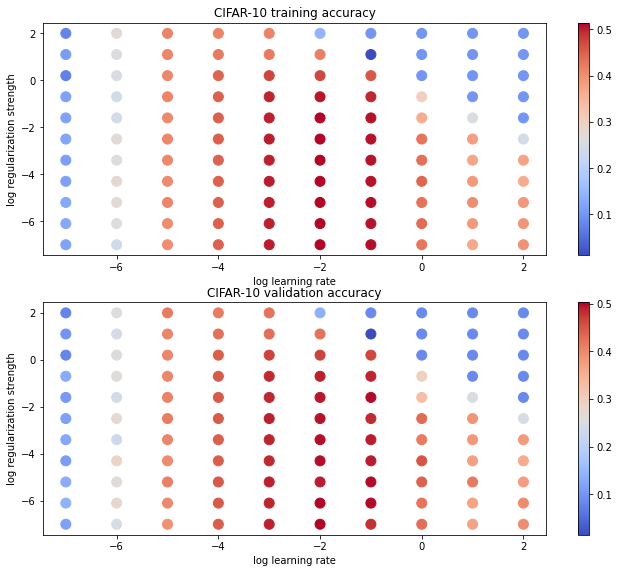

In [0]:
# Visualize the cross-validation results
import math
import pdb

# pdb.set_trace()

x_scatter = [math.log10(x[0]) for x in results]
y_scatter = [math.log10(x[1]) for x in results]

# plot training accuracy
marker_size = 100
colors = [results[x][0] for x in results]
plt.subplot(2, 1, 1)
plt.tight_layout(pad=3)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors, cmap=plt.cm.coolwarm)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 training accuracy')

# plot validation accuracy
colors = [results[x][1] for x in results] # default size of markers is 20
plt.subplot(2, 1, 2)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors, cmap=plt.cm.coolwarm)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 validation accuracy')
plt.show()

In [0]:
# Evaluate your trained SVM on the test set: you should be able to get at least 0.40
y_test_pred = best_svm.predict(X_test_feats)
test_accuracy = np.mean(y_test == y_test_pred)
print(test_accuracy)

0.492


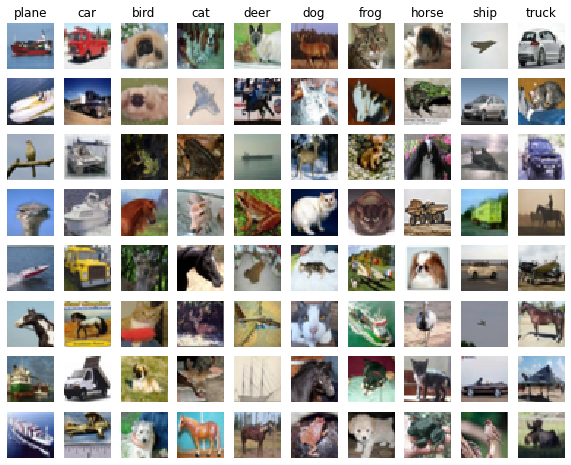

In [0]:
# An important way to gain intuition about how an algorithm works is to
# visualize the mistakes that it makes. In this visualization, we show examples
# of images that are misclassified by our current system. The first column
# shows images that our system labeled as "plane" but whose true label is
# something other than "plane".
examples_per_class = 8
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
for cls, cls_name in enumerate(classes):
    idxs = np.where((y_test != cls) & (y_test_pred == cls))[0]
    idxs = np.random.choice(idxs, examples_per_class, replace=False)
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(classes), i * len(classes) + cls + 1)
        plt.imshow(X_test[idx].astype('uint8'))
        plt.axis('off')
        if i == 0:
            plt.title(cls_name)
plt.show()

### Inline question 1:
Describe the misclassification results that you see. Do they make sense?


$\color{blue}{\textit Your Answer:}$




## Neural Network on image features
Earlier in this assigment we saw that training a two-layer neural network on raw pixels achieved better classification performance than linear classifiers on raw pixels. In this notebook we have seen that linear classifiers on image features outperform linear classifiers on raw pixels. 

For completeness, we should also try training a neural network on image features. This approach should outperform all previous approaches: you should easily be able to achieve over 55% classification accuracy on the test set; our best model achieves about 60% classification accuracy.

In [0]:
# Preprocessing: Remove the bias dimension
# Make sure to run this cell only ONCE
print(X_train_feats.shape)
X_train_feats = X_train_feats[:, :-1]
X_val_feats = X_val_feats[:, :-1]
X_test_feats = X_test_feats[:, :-1]

print(X_train_feats.shape)

(49000, 155)
(49000, 154)


learning_rate 1e-10
regularization_strength 1e-10


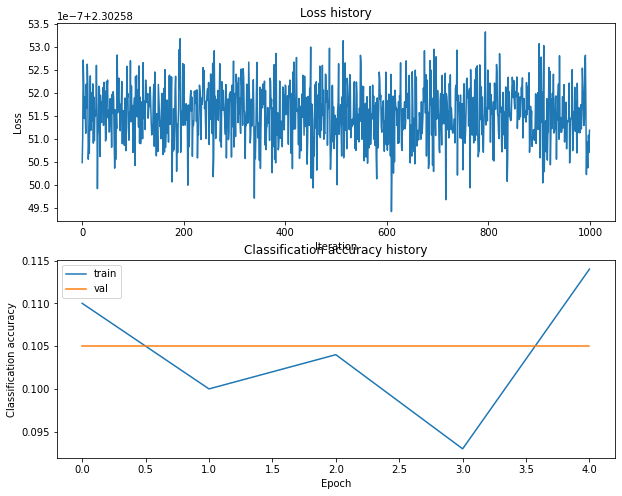

learning_rate 1e-10
regularization_strength 1.2915496650148826e-09


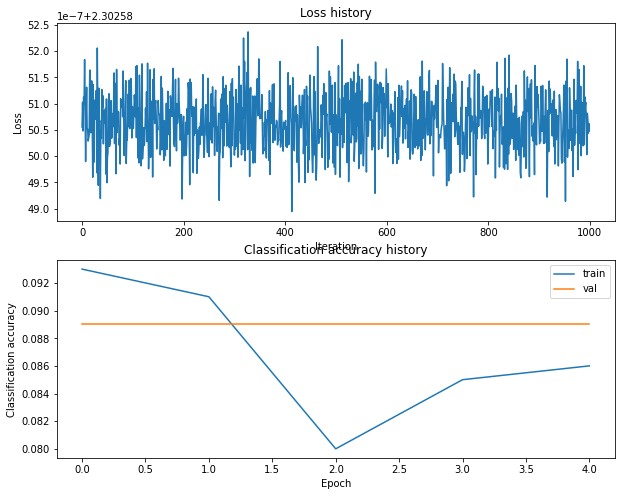

learning_rate 1e-10
regularization_strength 1.6681005372000592e-08


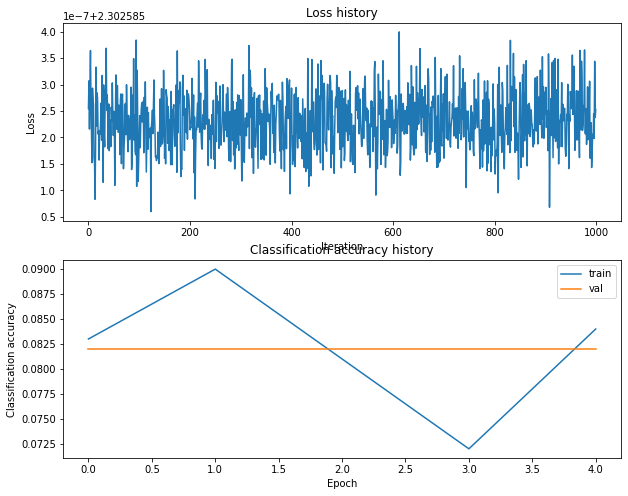

learning_rate 1e-10
regularization_strength 2.1544346900318867e-07


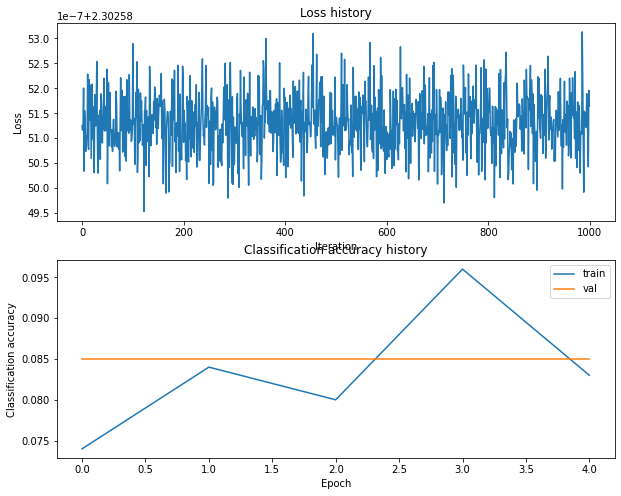

learning_rate 1e-10
regularization_strength 2.782559402207126e-06


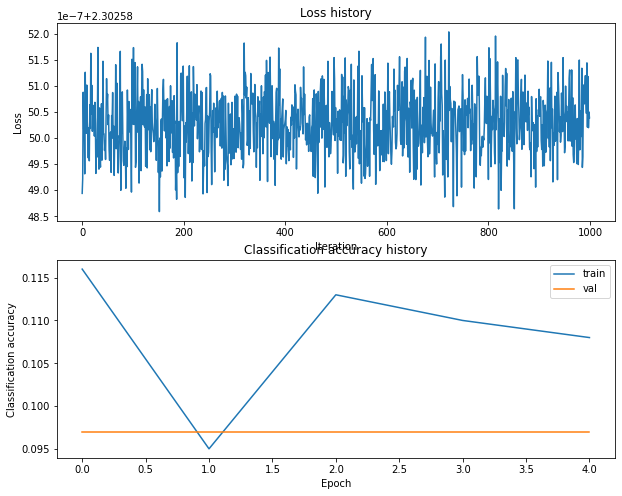

learning_rate 1e-10
regularization_strength 3.5938136638046256e-05


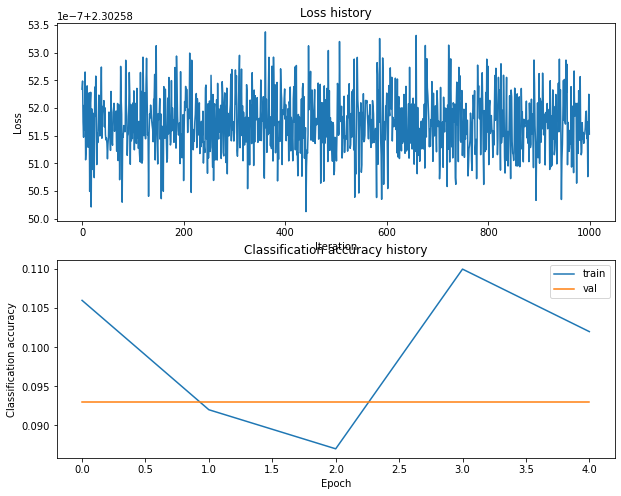

learning_rate 1e-10
regularization_strength 0.0004641588833612782


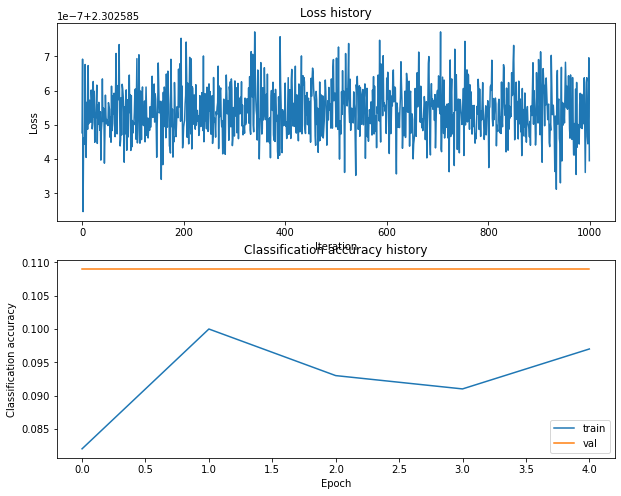

learning_rate 1e-10
regularization_strength 0.005994842503189421


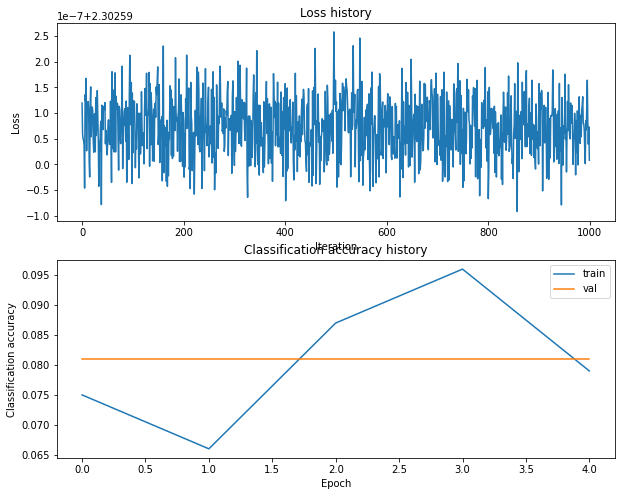

learning_rate 1e-10
regularization_strength 0.07742636826811278


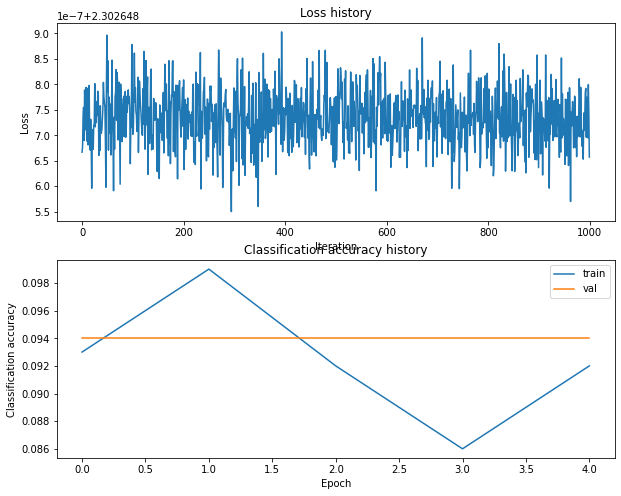

learning_rate 1e-10
regularization_strength 1.0


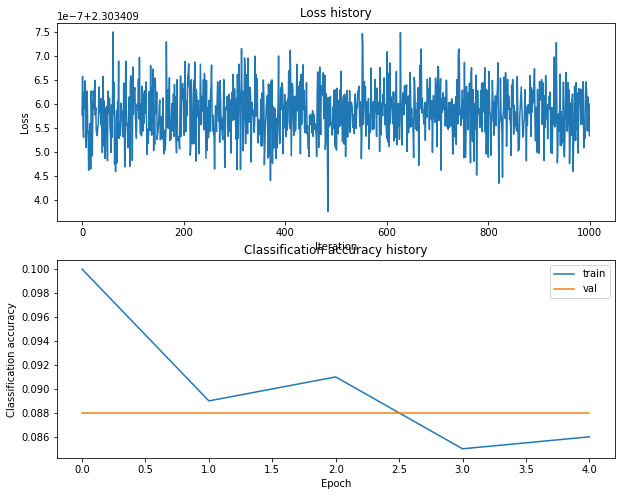

learning_rate 1.2915496650148826e-09
regularization_strength 1e-10


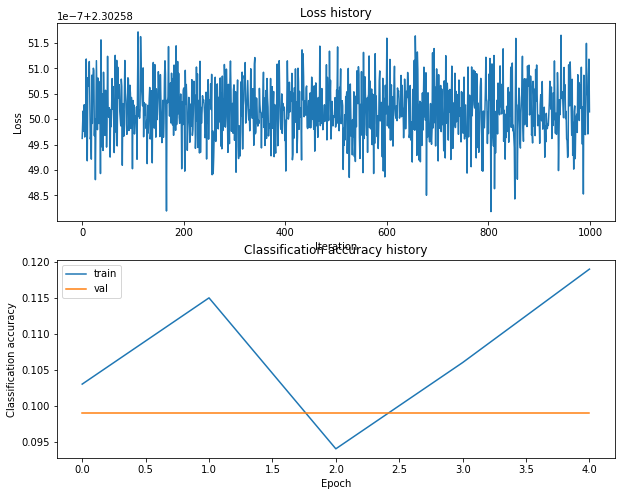

learning_rate 1.2915496650148826e-09
regularization_strength 1.2915496650148826e-09


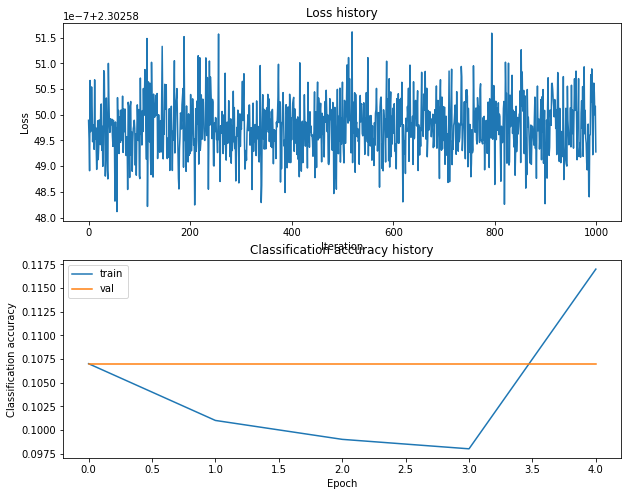

learning_rate 1.2915496650148826e-09
regularization_strength 1.6681005372000592e-08


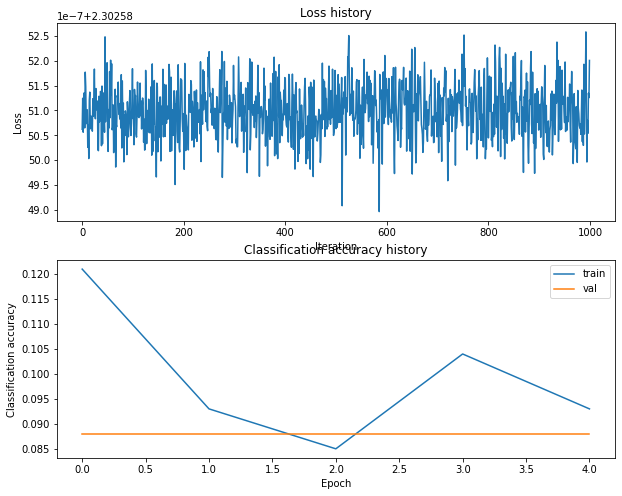

learning_rate 1.2915496650148826e-09
regularization_strength 2.1544346900318867e-07


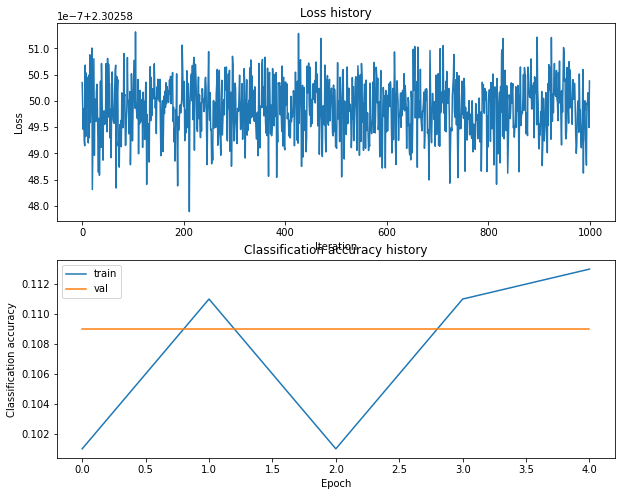

learning_rate 1.2915496650148826e-09
regularization_strength 2.782559402207126e-06


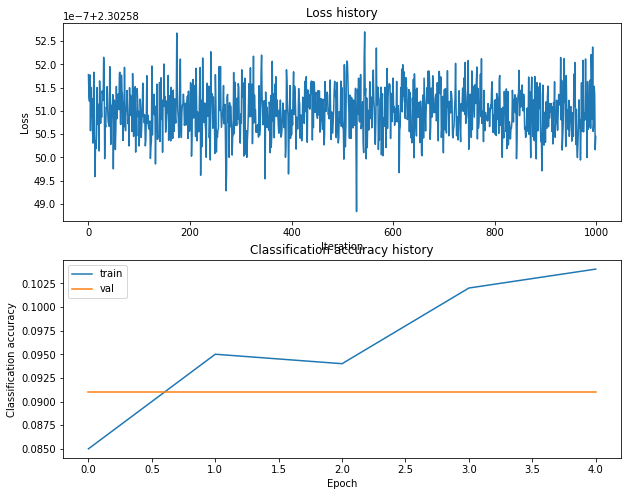

learning_rate 1.2915496650148826e-09
regularization_strength 3.5938136638046256e-05


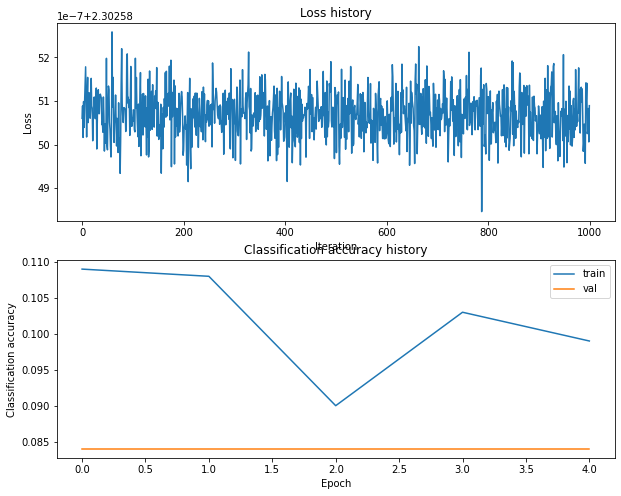

learning_rate 1.2915496650148826e-09
regularization_strength 0.0004641588833612782


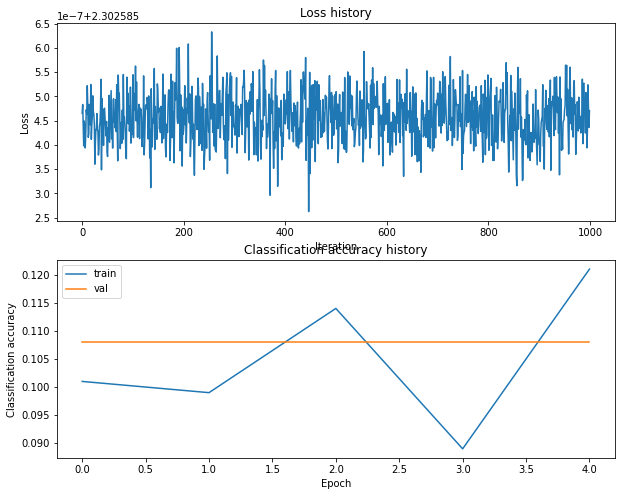

learning_rate 1.2915496650148826e-09
regularization_strength 0.005994842503189421


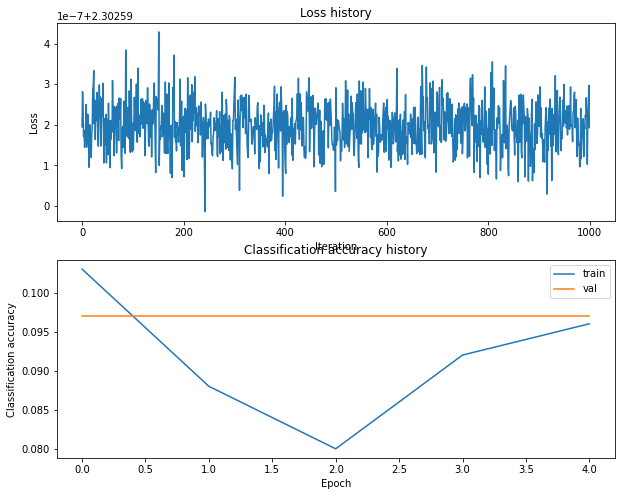

learning_rate 1.2915496650148826e-09
regularization_strength 0.07742636826811278


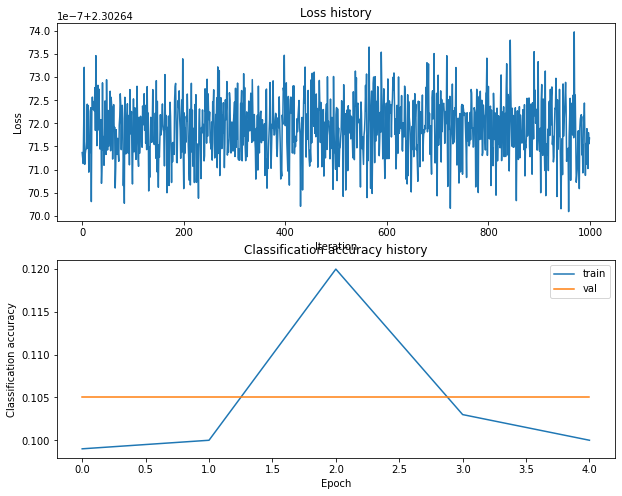

learning_rate 1.2915496650148826e-09
regularization_strength 1.0


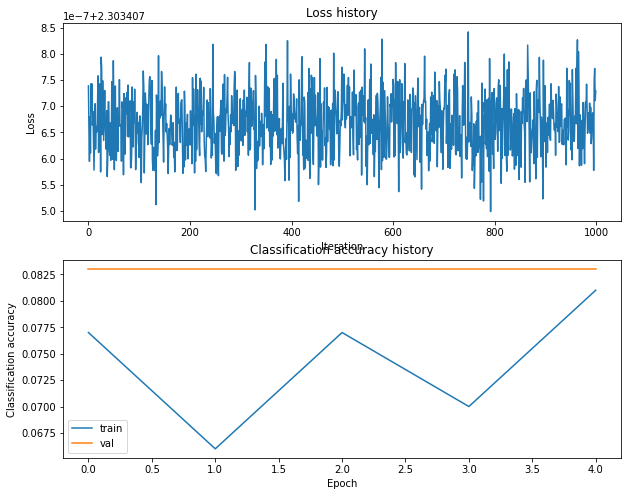

learning_rate 1.6681005372000592e-08
regularization_strength 1e-10


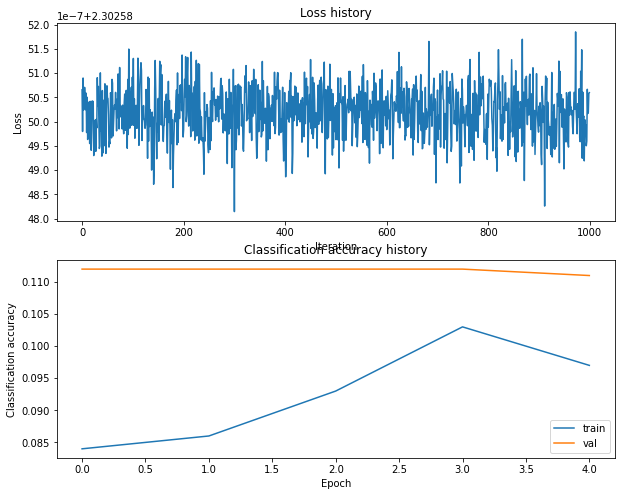

learning_rate 1.6681005372000592e-08
regularization_strength 1.2915496650148826e-09


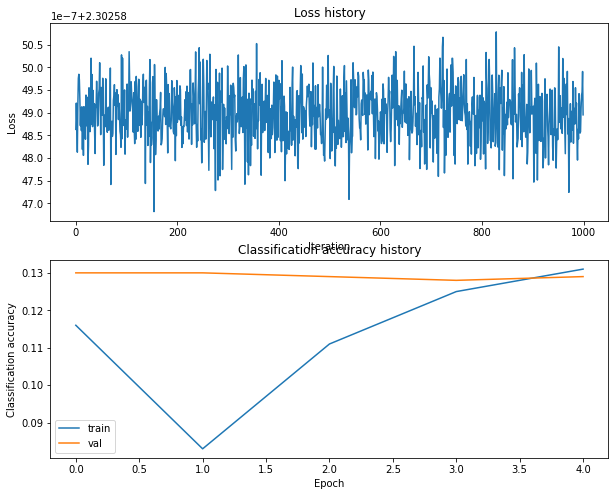

learning_rate 1.6681005372000592e-08
regularization_strength 1.6681005372000592e-08


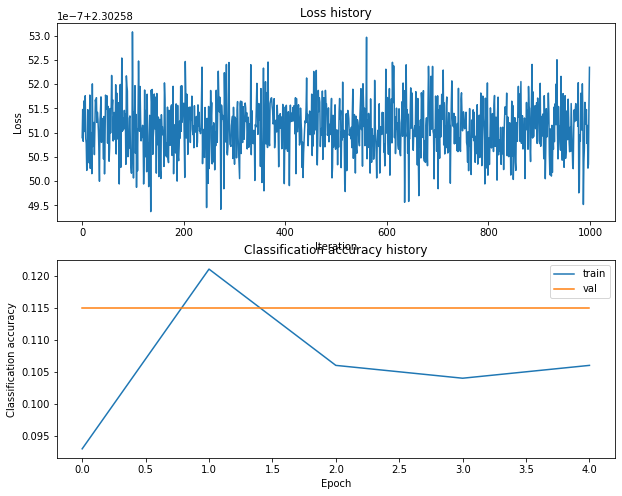

learning_rate 1.6681005372000592e-08
regularization_strength 2.1544346900318867e-07


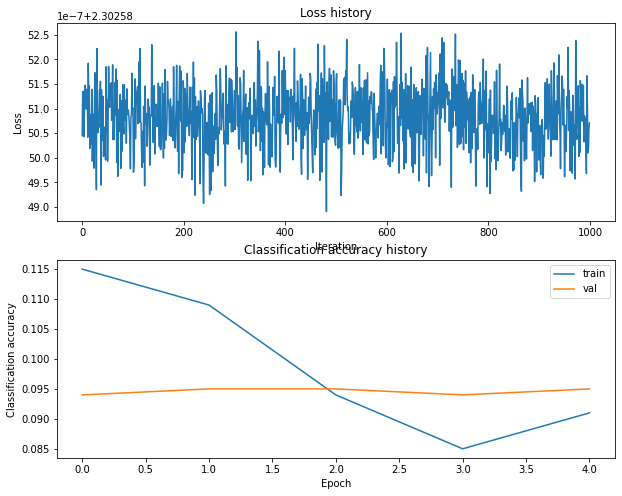

learning_rate 1.6681005372000592e-08
regularization_strength 2.782559402207126e-06


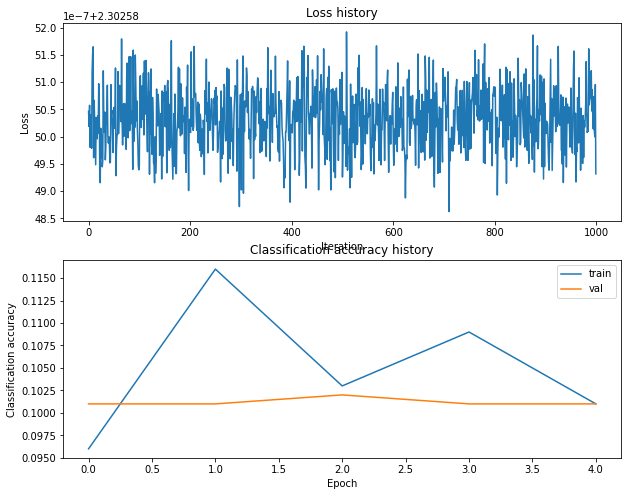

learning_rate 1.6681005372000592e-08
regularization_strength 3.5938136638046256e-05


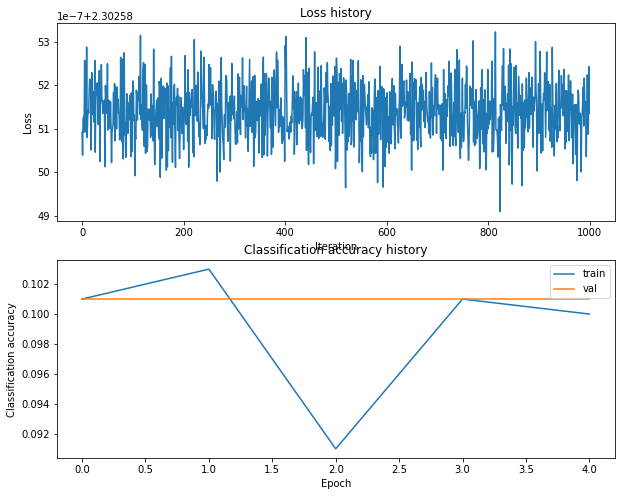

learning_rate 1.6681005372000592e-08
regularization_strength 0.0004641588833612782


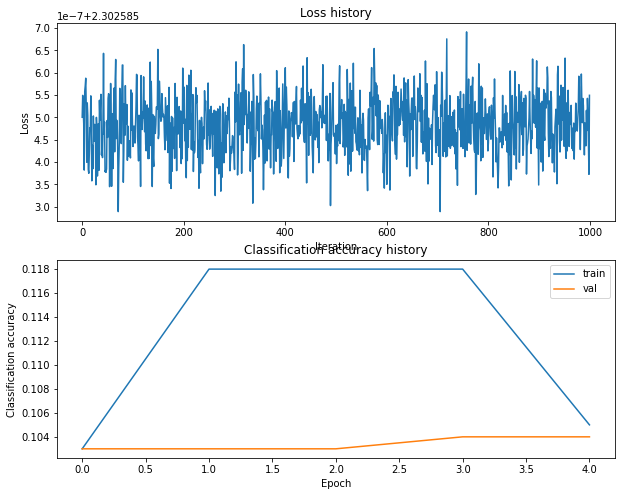

learning_rate 1.6681005372000592e-08
regularization_strength 0.005994842503189421


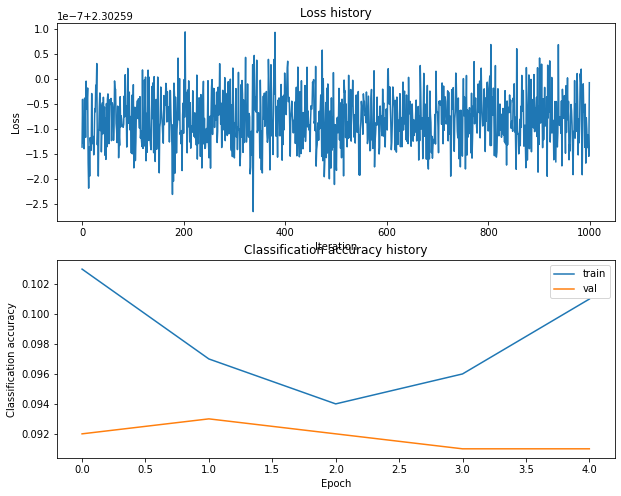

learning_rate 1.6681005372000592e-08
regularization_strength 0.07742636826811278


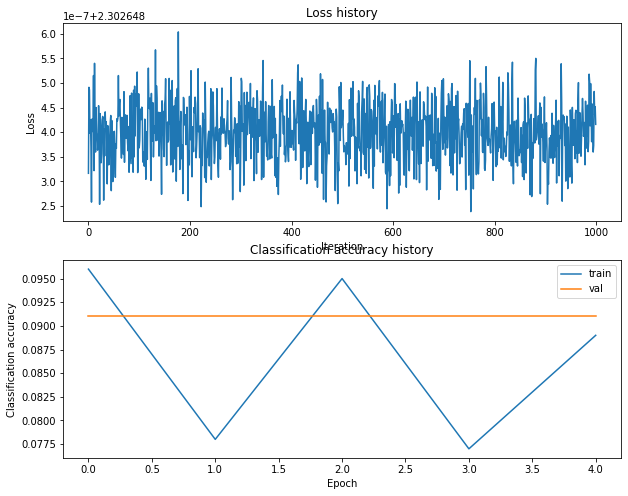

learning_rate 1.6681005372000592e-08
regularization_strength 1.0


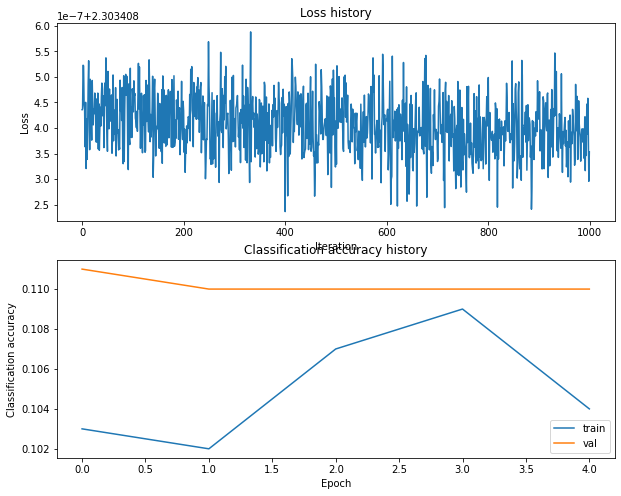

learning_rate 2.1544346900318867e-07
regularization_strength 1e-10


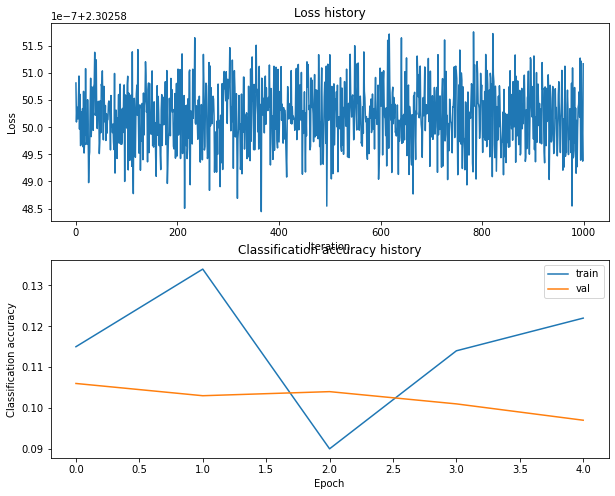

learning_rate 2.1544346900318867e-07
regularization_strength 1.2915496650148826e-09


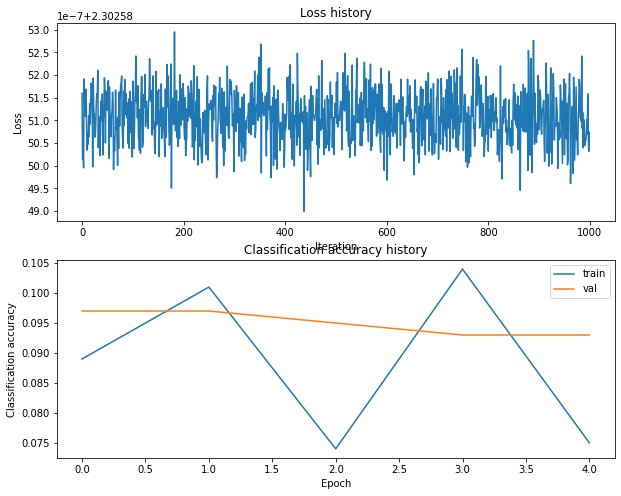

learning_rate 2.1544346900318867e-07
regularization_strength 1.6681005372000592e-08


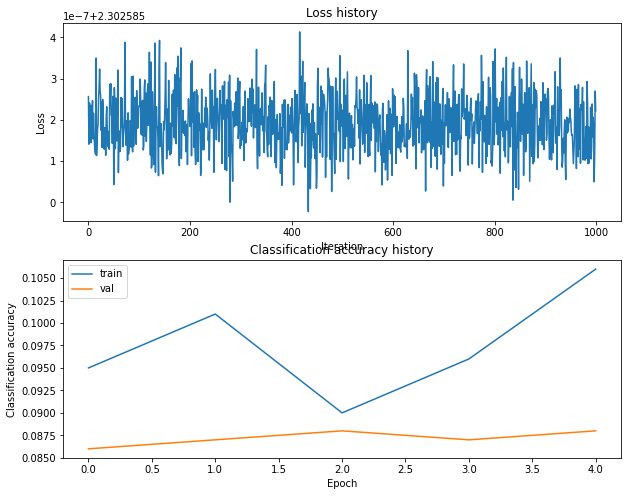

learning_rate 2.1544346900318867e-07
regularization_strength 2.1544346900318867e-07


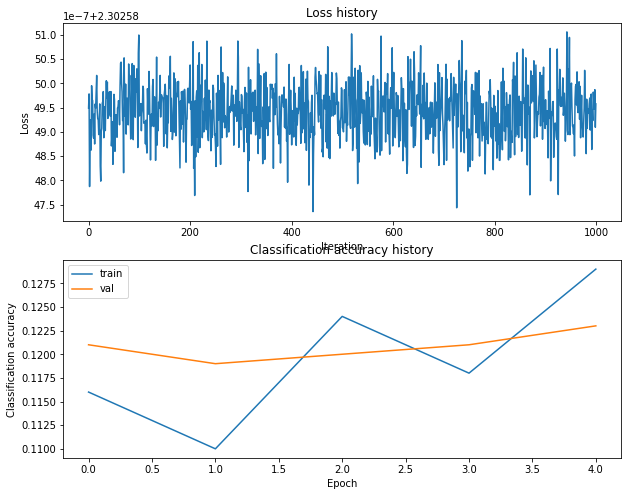

learning_rate 2.1544346900318867e-07
regularization_strength 2.782559402207126e-06


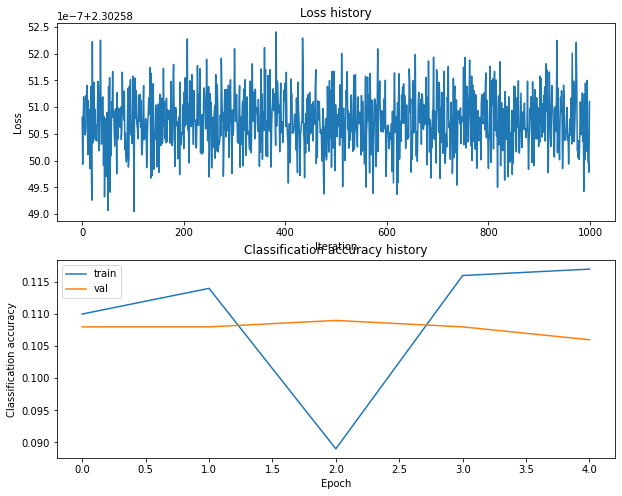

learning_rate 2.1544346900318867e-07
regularization_strength 3.5938136638046256e-05


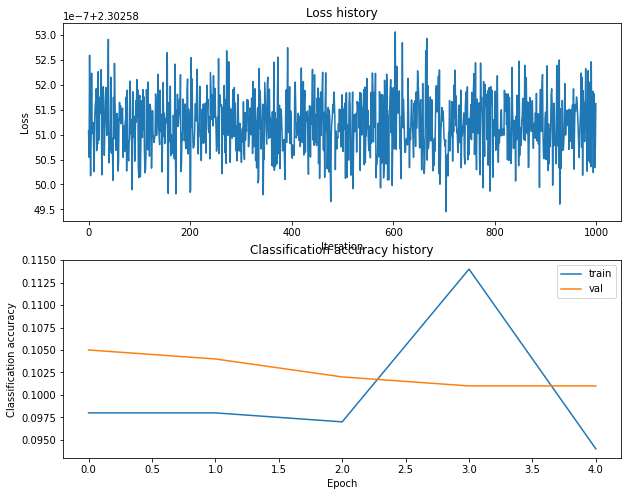

learning_rate 2.1544346900318867e-07
regularization_strength 0.0004641588833612782


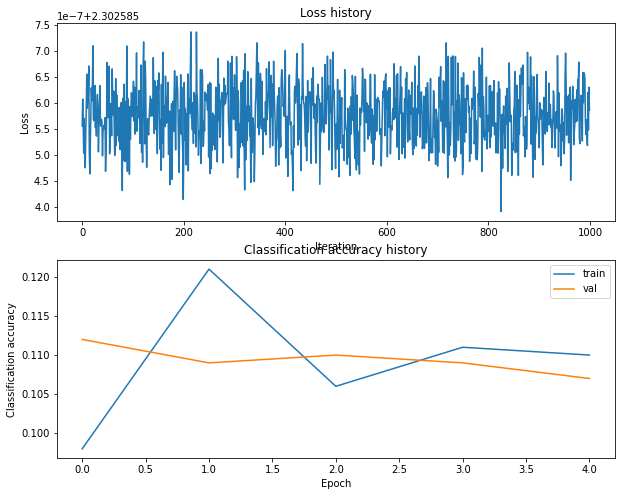

learning_rate 2.1544346900318867e-07
regularization_strength 0.005994842503189421


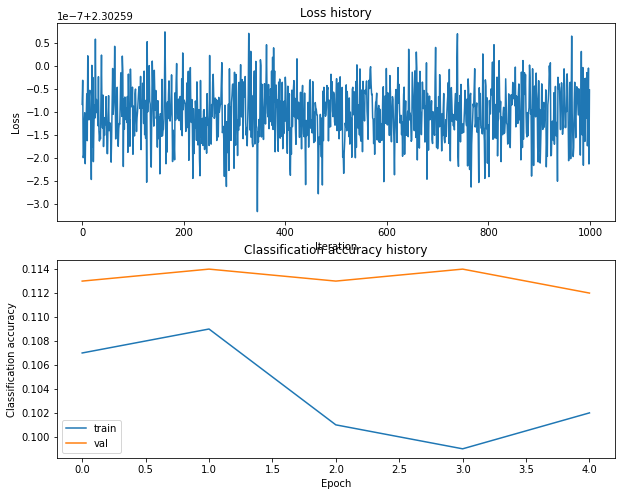

learning_rate 2.1544346900318867e-07
regularization_strength 0.07742636826811278


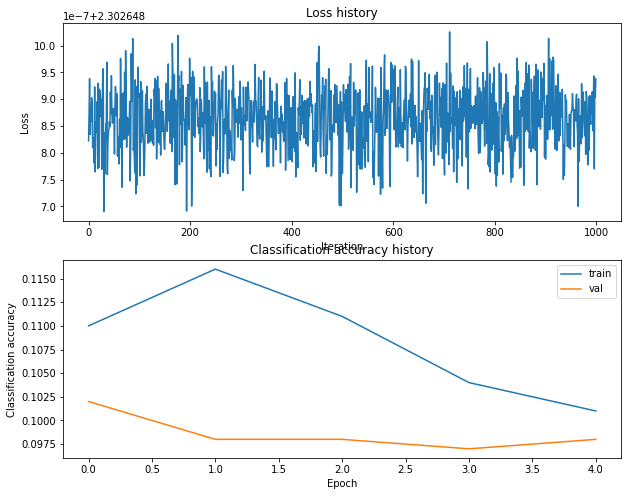

learning_rate 2.1544346900318867e-07
regularization_strength 1.0


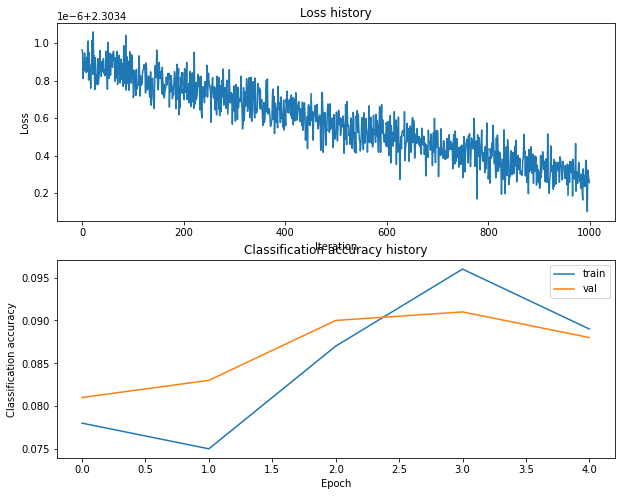

learning_rate 2.782559402207126e-06
regularization_strength 1e-10


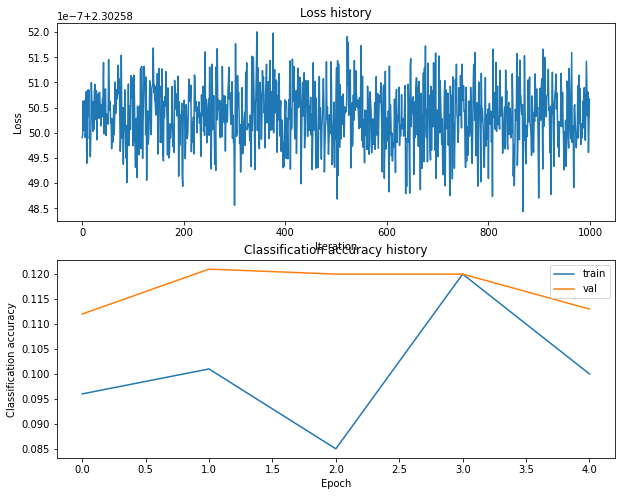

learning_rate 2.782559402207126e-06
regularization_strength 1.2915496650148826e-09


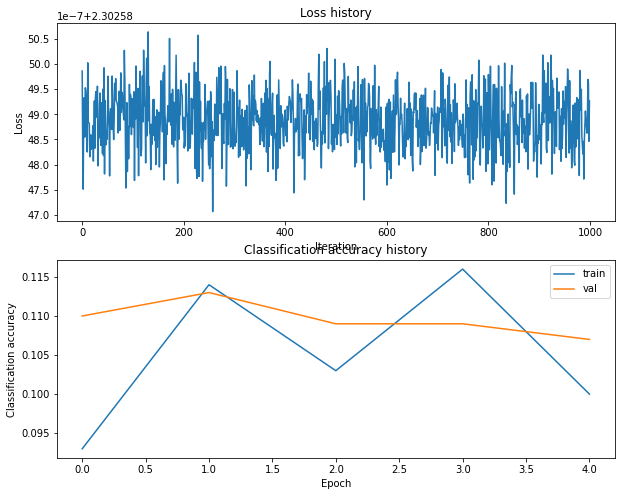

learning_rate 2.782559402207126e-06
regularization_strength 1.6681005372000592e-08


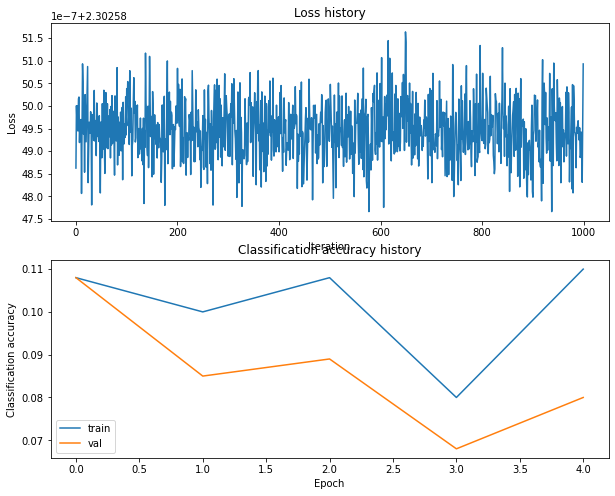

learning_rate 2.782559402207126e-06
regularization_strength 2.1544346900318867e-07


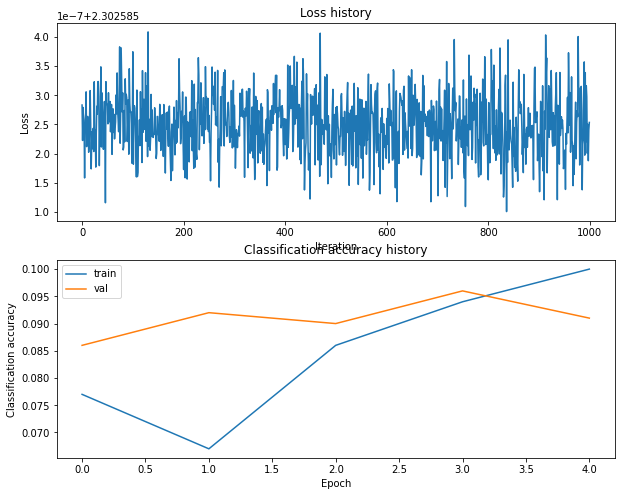

learning_rate 2.782559402207126e-06
regularization_strength 2.782559402207126e-06


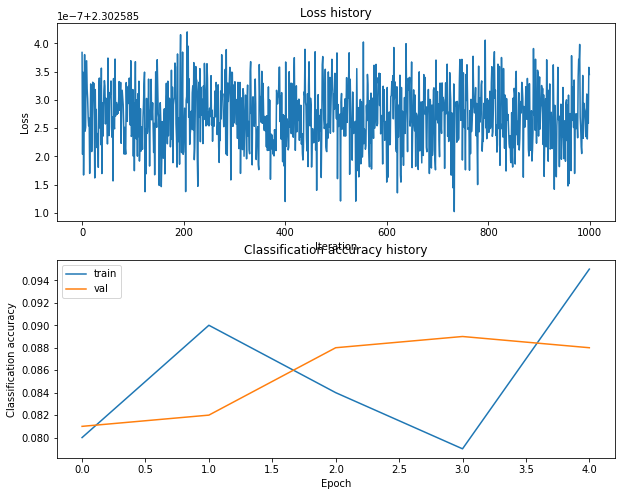

learning_rate 2.782559402207126e-06
regularization_strength 3.5938136638046256e-05


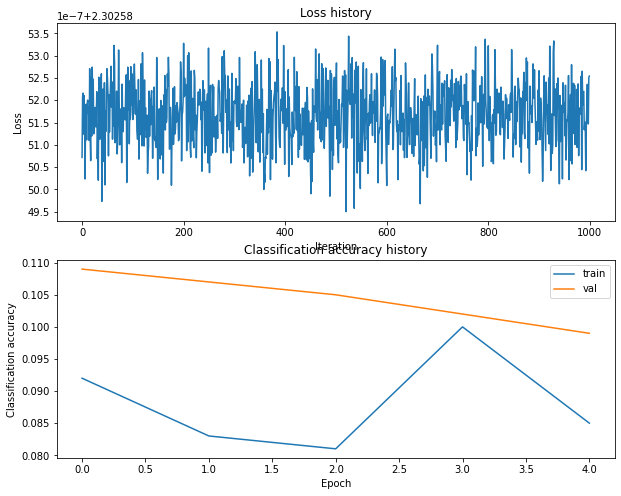

learning_rate 2.782559402207126e-06
regularization_strength 0.0004641588833612782


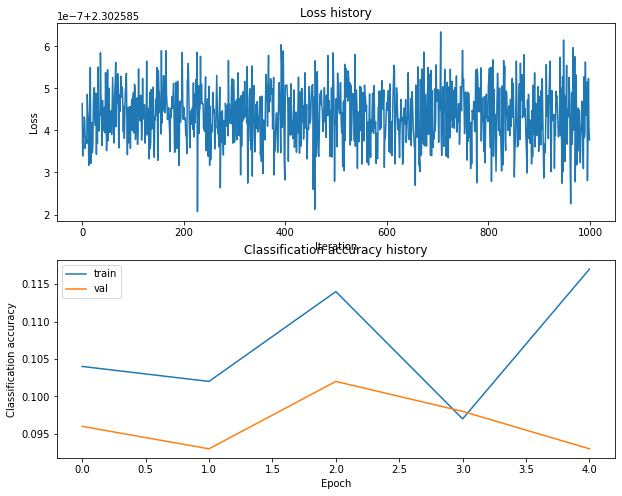

learning_rate 2.782559402207126e-06
regularization_strength 0.005994842503189421


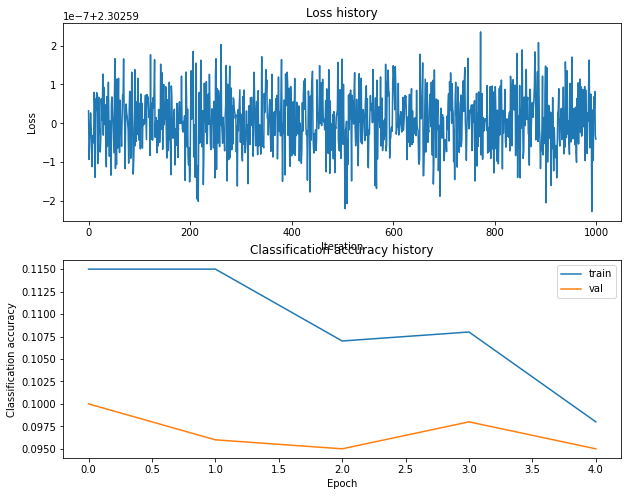

learning_rate 2.782559402207126e-06
regularization_strength 0.07742636826811278


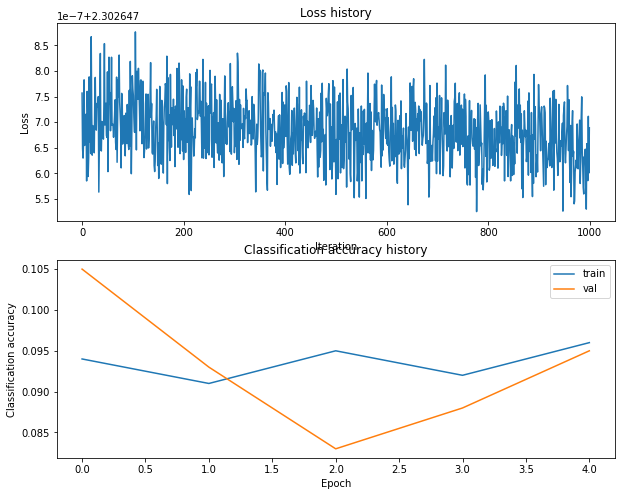

learning_rate 2.782559402207126e-06
regularization_strength 1.0


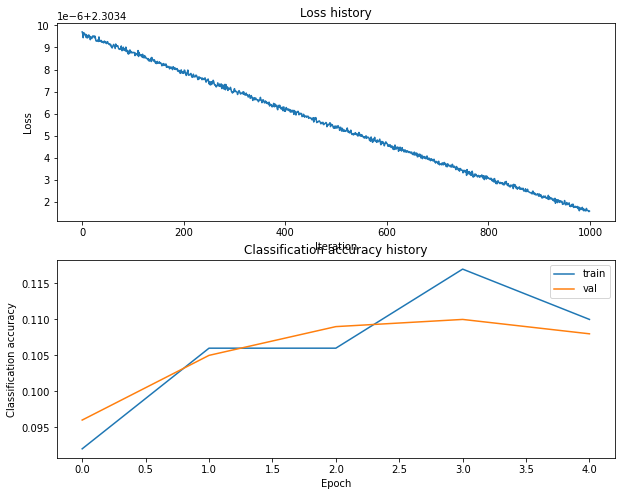

learning_rate 3.5938136638046256e-05
regularization_strength 1e-10


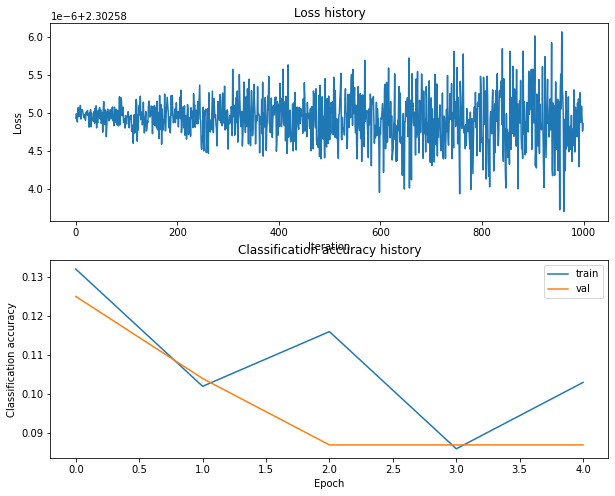

learning_rate 3.5938136638046256e-05
regularization_strength 1.2915496650148826e-09


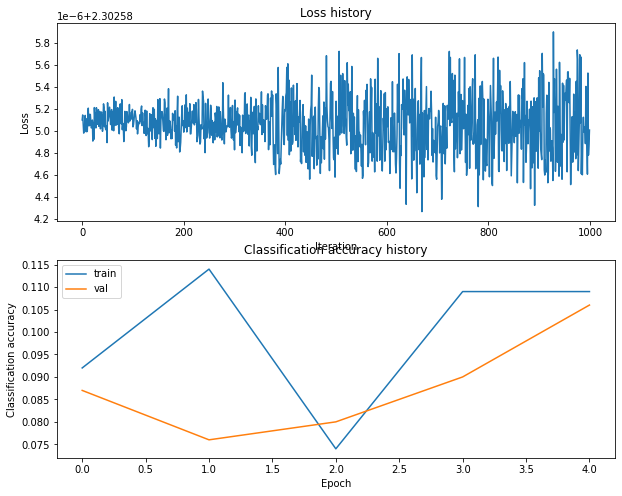

learning_rate 3.5938136638046256e-05
regularization_strength 1.6681005372000592e-08


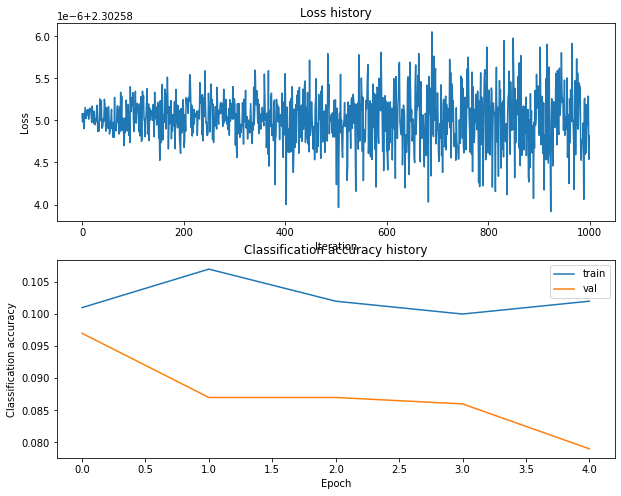

learning_rate 3.5938136638046256e-05
regularization_strength 2.1544346900318867e-07


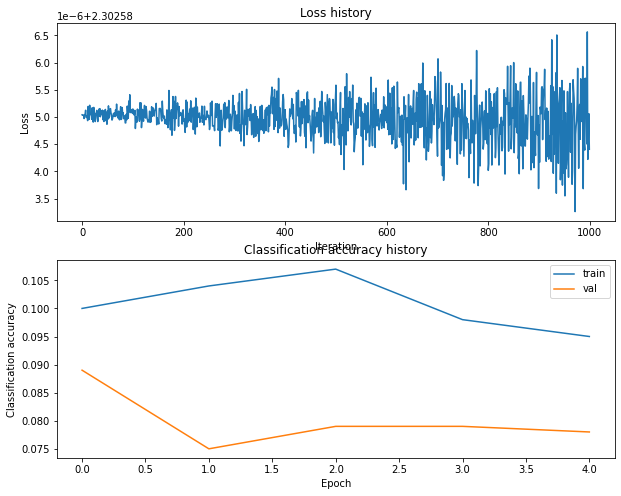

learning_rate 3.5938136638046256e-05
regularization_strength 2.782559402207126e-06


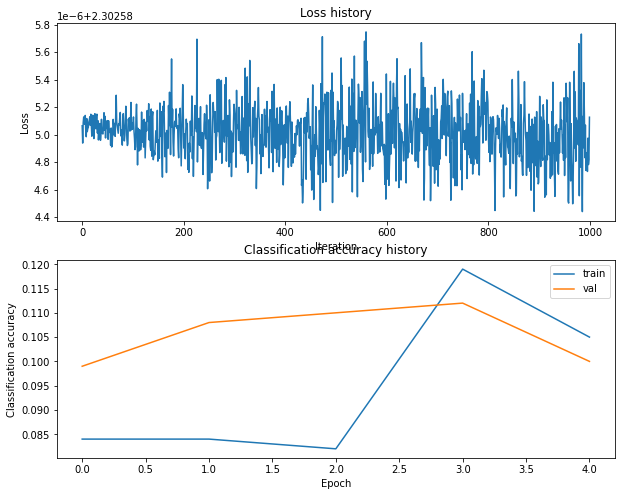

learning_rate 3.5938136638046256e-05
regularization_strength 3.5938136638046256e-05


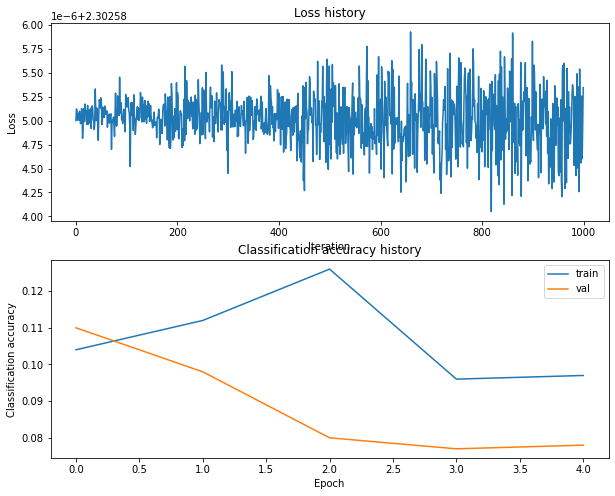

learning_rate 3.5938136638046256e-05
regularization_strength 0.0004641588833612782


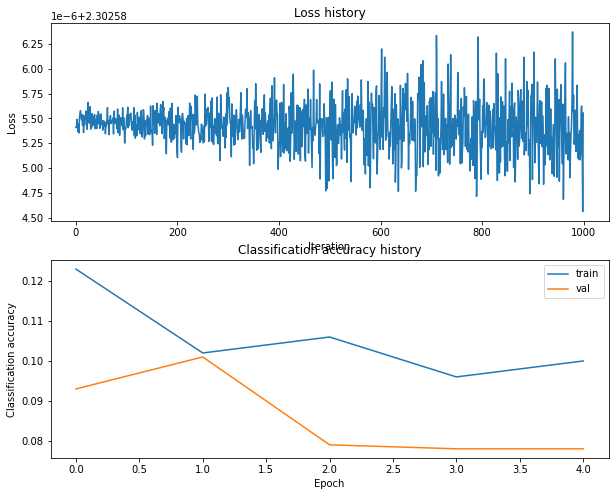

learning_rate 3.5938136638046256e-05
regularization_strength 0.005994842503189421


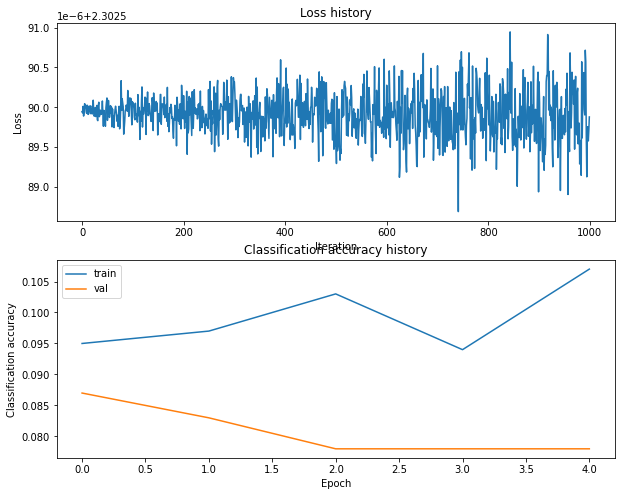

learning_rate 3.5938136638046256e-05
regularization_strength 0.07742636826811278


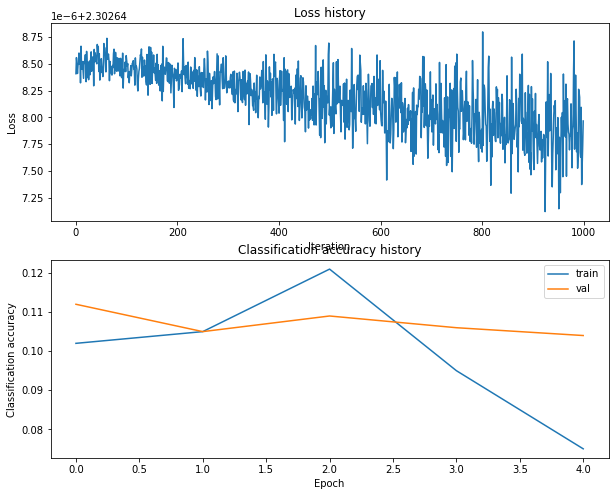

learning_rate 3.5938136638046256e-05
regularization_strength 1.0


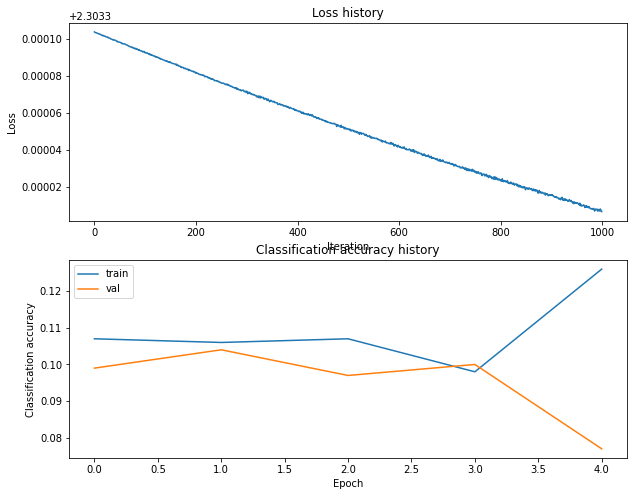

learning_rate 0.0004641588833612782
regularization_strength 1e-10


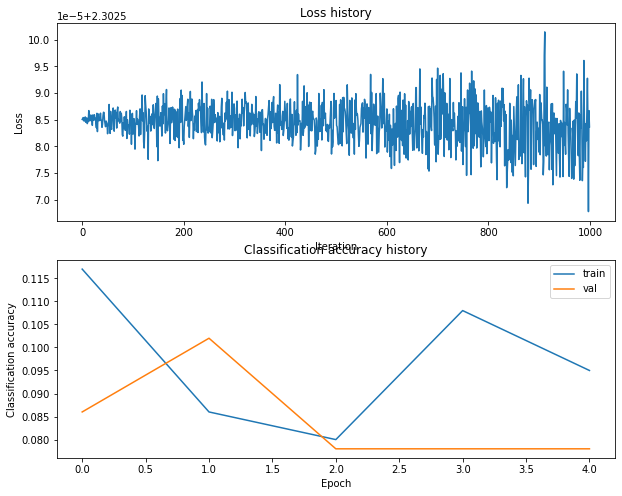

learning_rate 0.0004641588833612782
regularization_strength 1.2915496650148826e-09


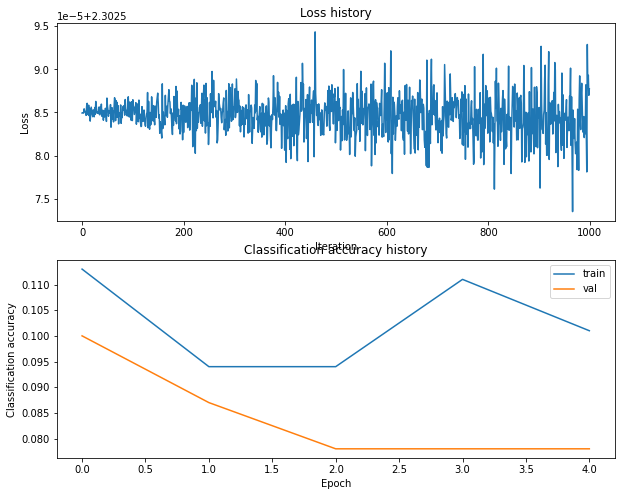

learning_rate 0.0004641588833612782
regularization_strength 1.6681005372000592e-08


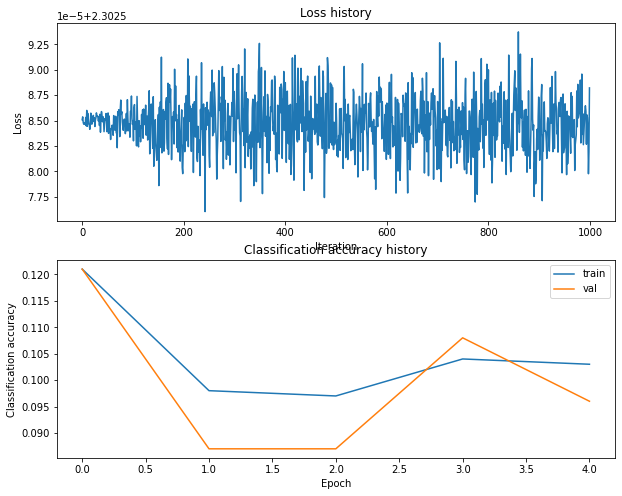

learning_rate 0.0004641588833612782
regularization_strength 2.1544346900318867e-07


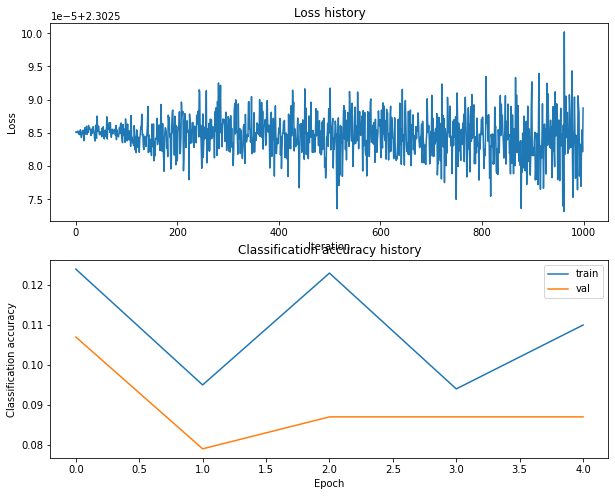

learning_rate 0.0004641588833612782
regularization_strength 2.782559402207126e-06


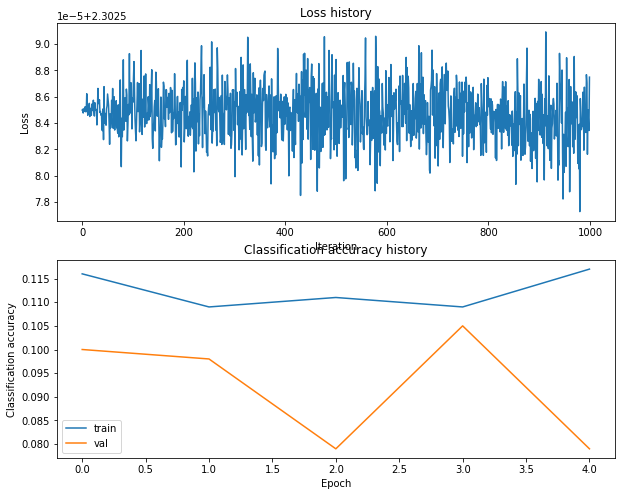

learning_rate 0.0004641588833612782
regularization_strength 3.5938136638046256e-05


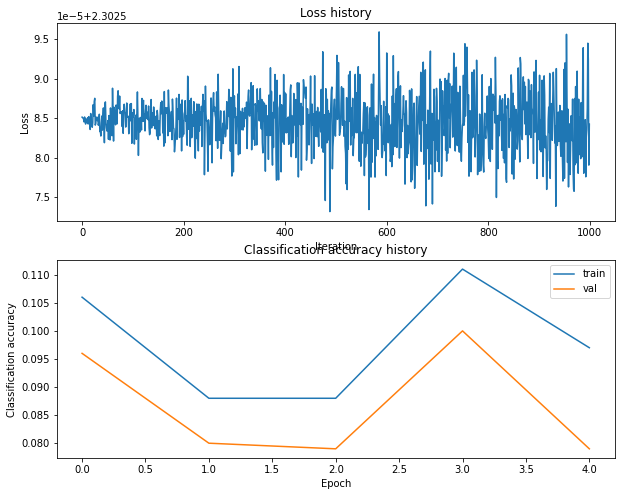

learning_rate 0.0004641588833612782
regularization_strength 0.0004641588833612782


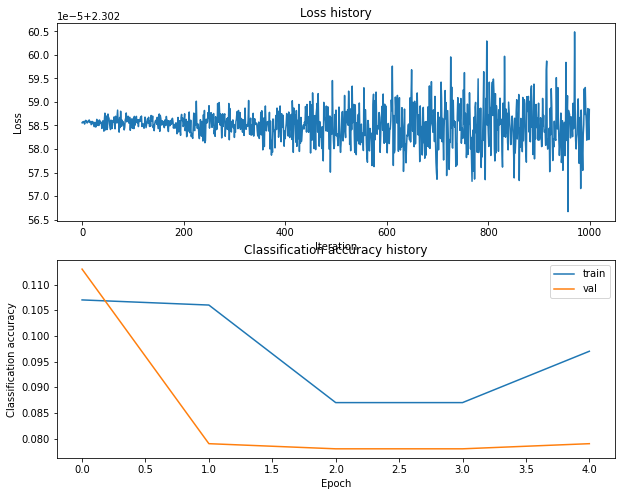

learning_rate 0.0004641588833612782
regularization_strength 0.005994842503189421


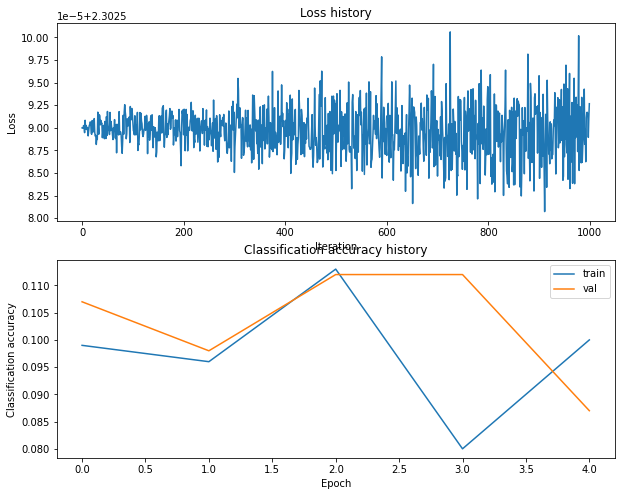

learning_rate 0.0004641588833612782
regularization_strength 0.07742636826811278


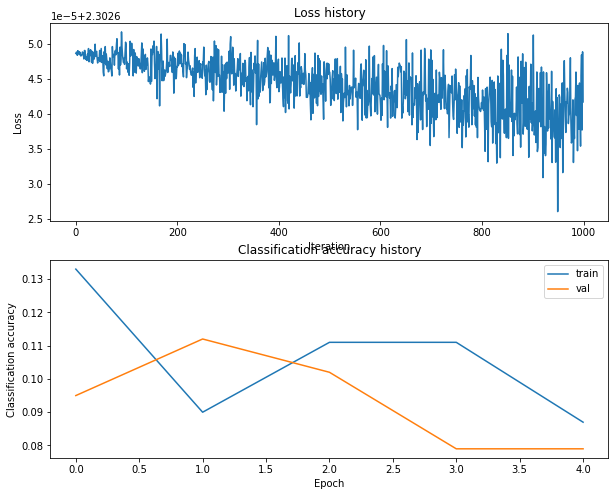

learning_rate 0.0004641588833612782
regularization_strength 1.0


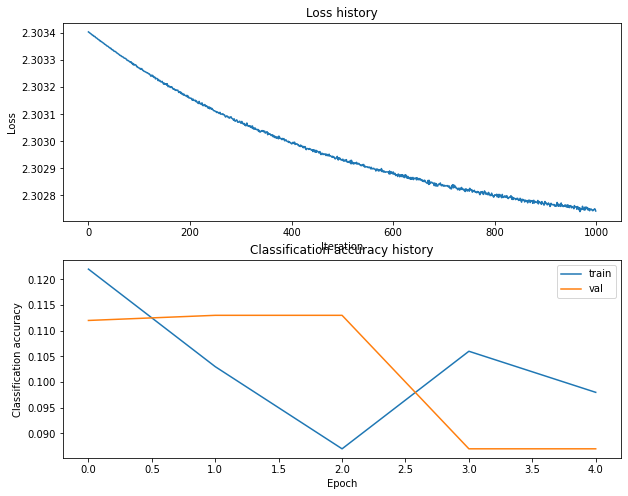

learning_rate 0.005994842503189421
regularization_strength 1e-10


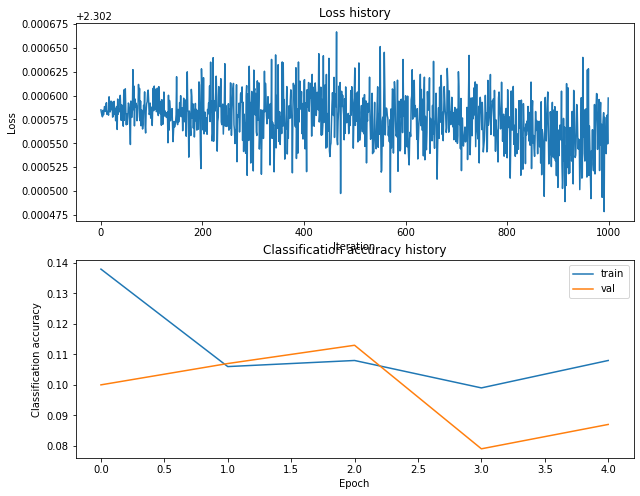

learning_rate 0.005994842503189421
regularization_strength 1.2915496650148826e-09


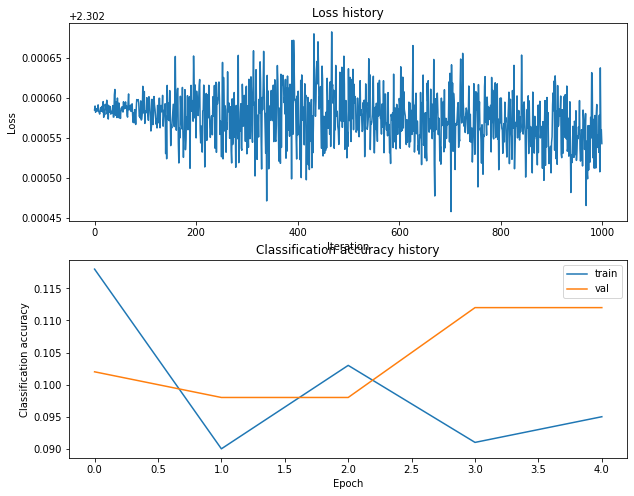

learning_rate 0.005994842503189421
regularization_strength 1.6681005372000592e-08


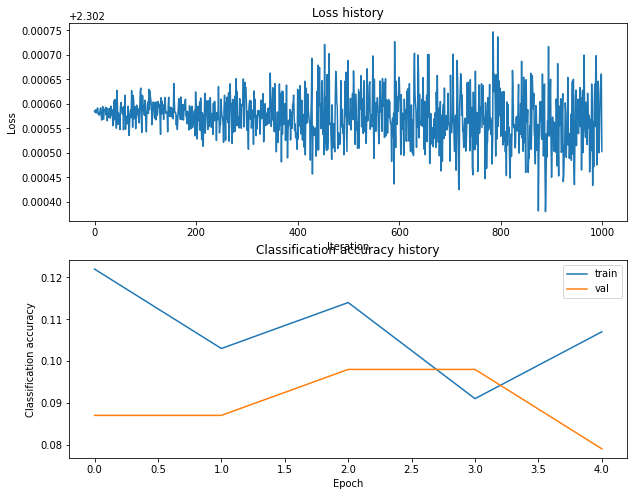

learning_rate 0.005994842503189421
regularization_strength 2.1544346900318867e-07


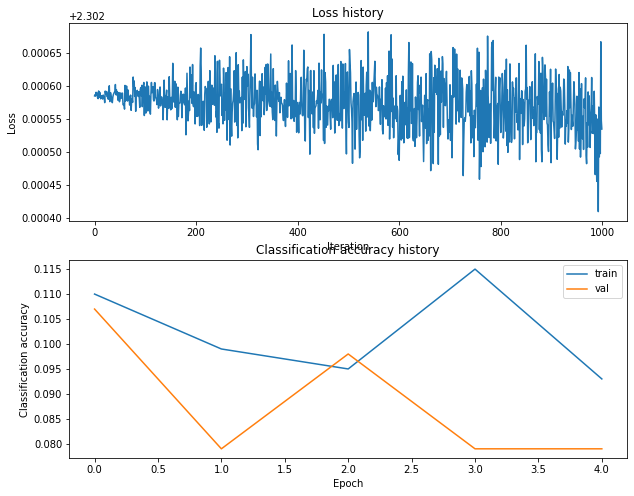

learning_rate 0.005994842503189421
regularization_strength 2.782559402207126e-06


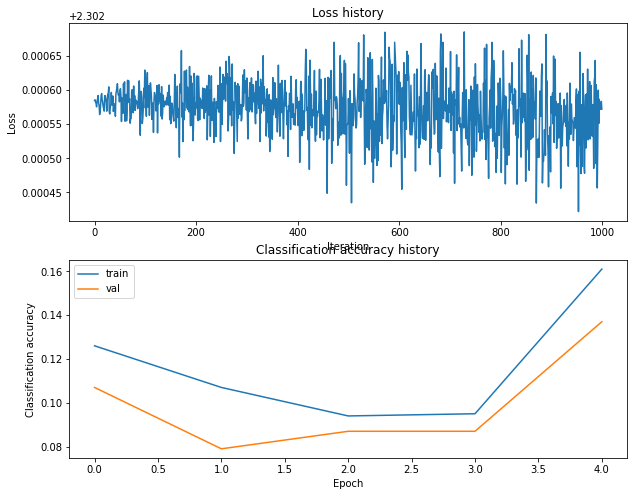

learning_rate 0.005994842503189421
regularization_strength 3.5938136638046256e-05


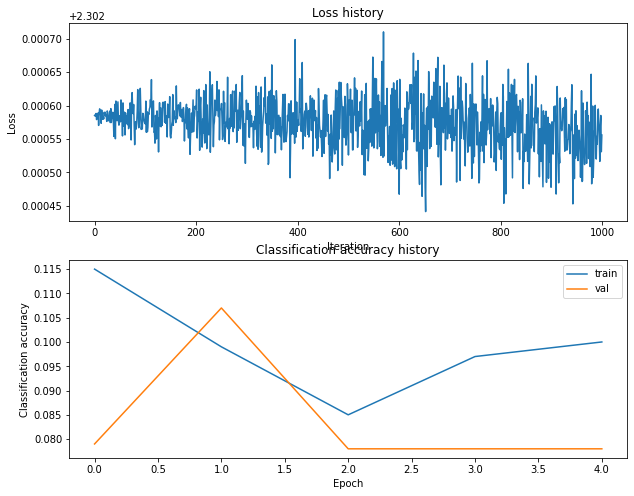

learning_rate 0.005994842503189421
regularization_strength 0.0004641588833612782


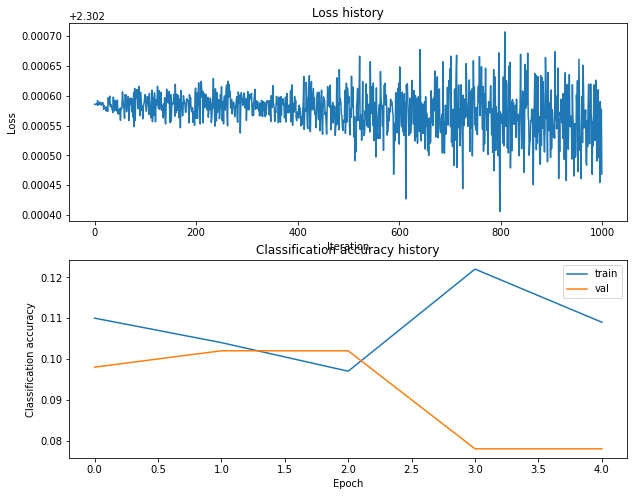

learning_rate 0.005994842503189421
regularization_strength 0.005994842503189421


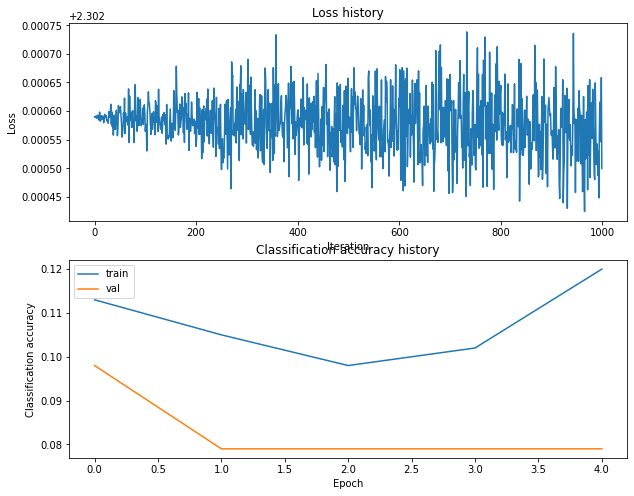

learning_rate 0.005994842503189421
regularization_strength 0.07742636826811278


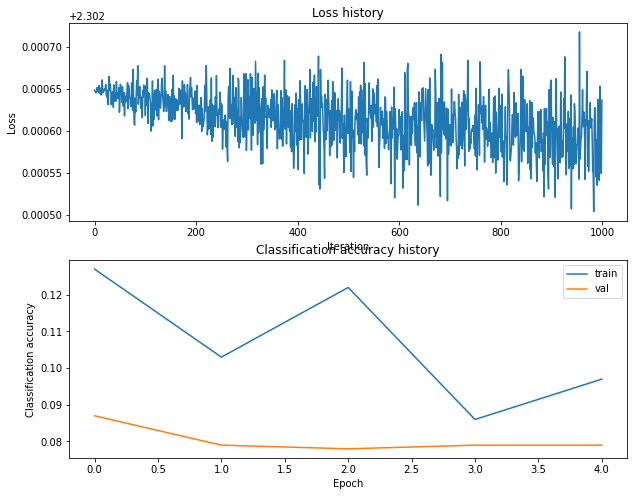

learning_rate 0.005994842503189421
regularization_strength 1.0


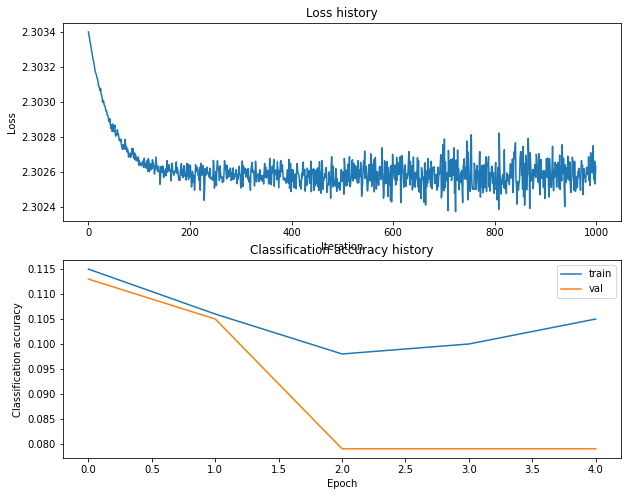

learning_rate 0.07742636826811278
regularization_strength 1e-10


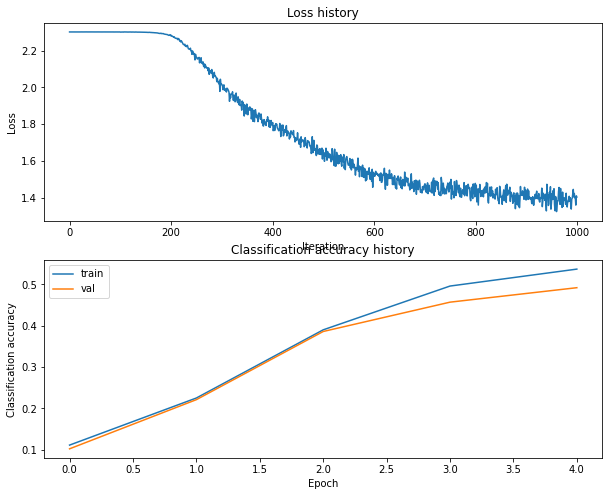

learning_rate 0.07742636826811278
regularization_strength 1.2915496650148826e-09


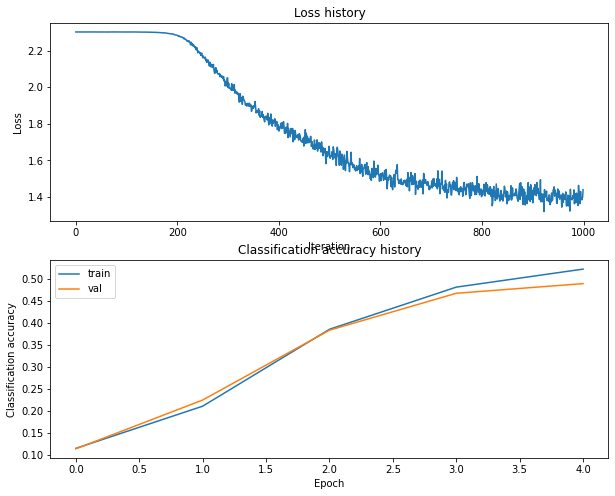

learning_rate 0.07742636826811278
regularization_strength 1.6681005372000592e-08


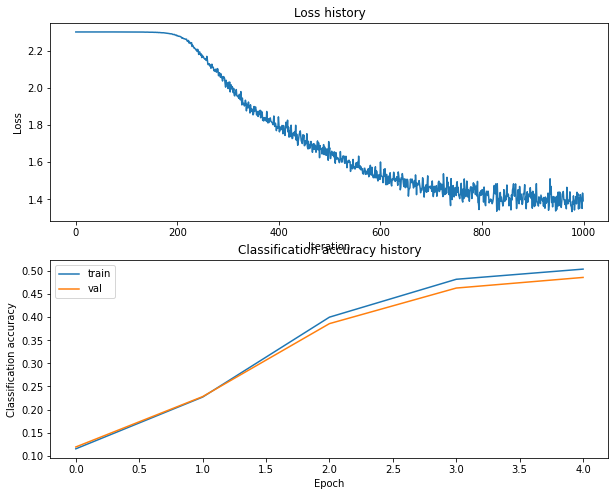

learning_rate 0.07742636826811278
regularization_strength 2.1544346900318867e-07


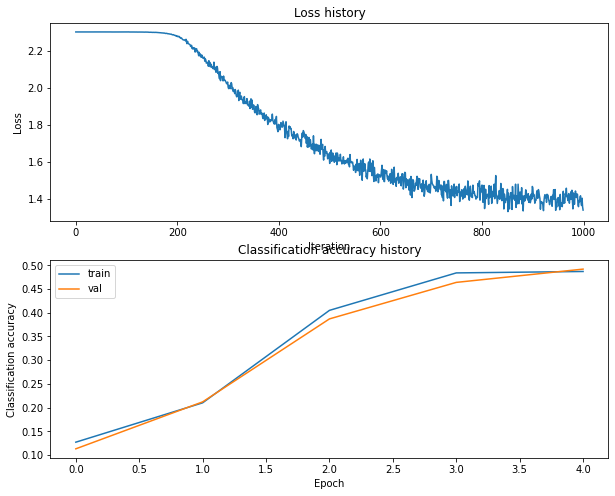

learning_rate 0.07742636826811278
regularization_strength 2.782559402207126e-06


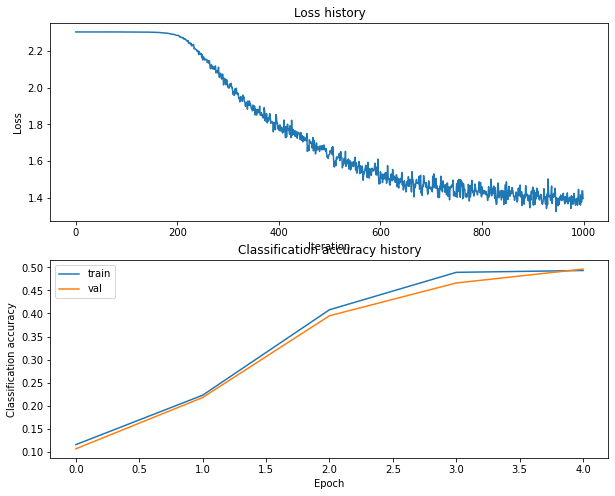

learning_rate 0.07742636826811278
regularization_strength 3.5938136638046256e-05


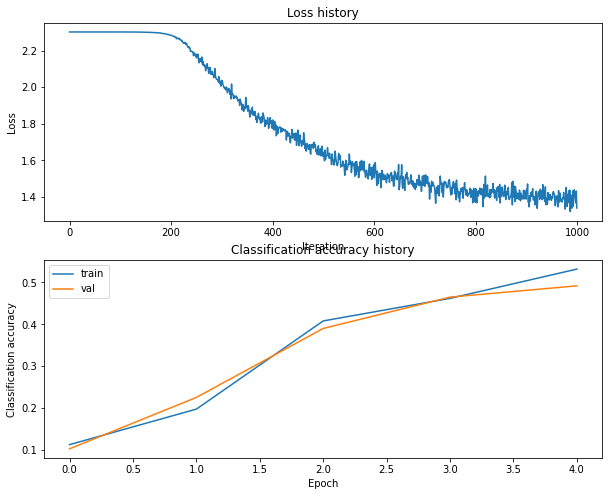

learning_rate 0.07742636826811278
regularization_strength 0.0004641588833612782


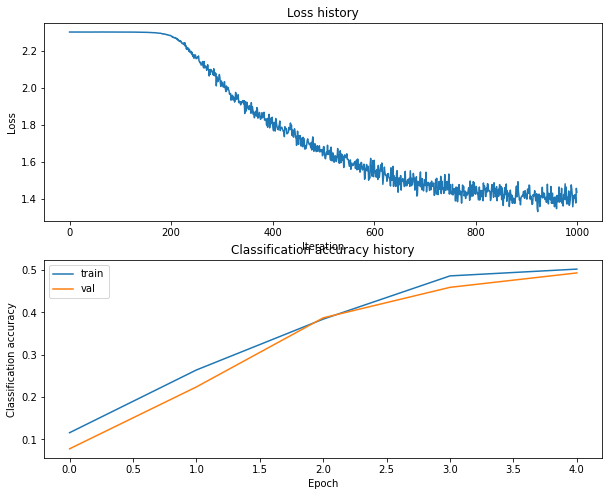

learning_rate 0.07742636826811278
regularization_strength 0.005994842503189421


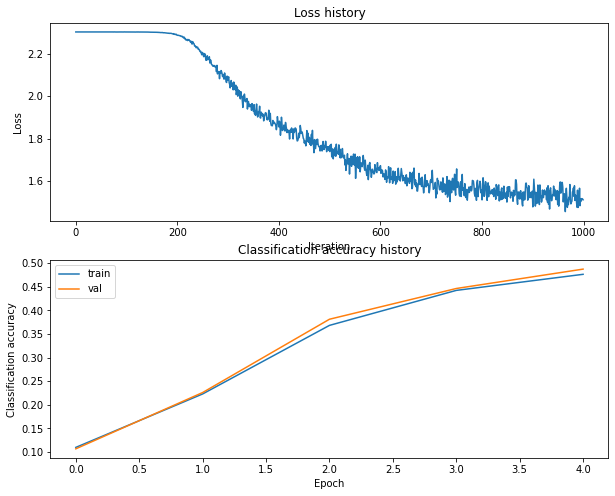

learning_rate 0.07742636826811278
regularization_strength 0.07742636826811278


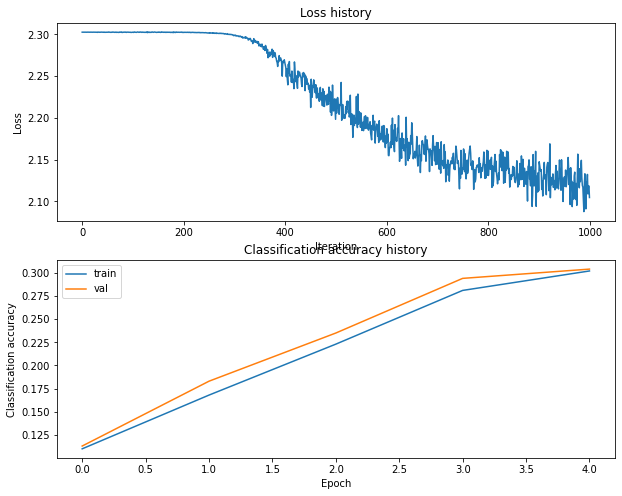

learning_rate 0.07742636826811278
regularization_strength 1.0


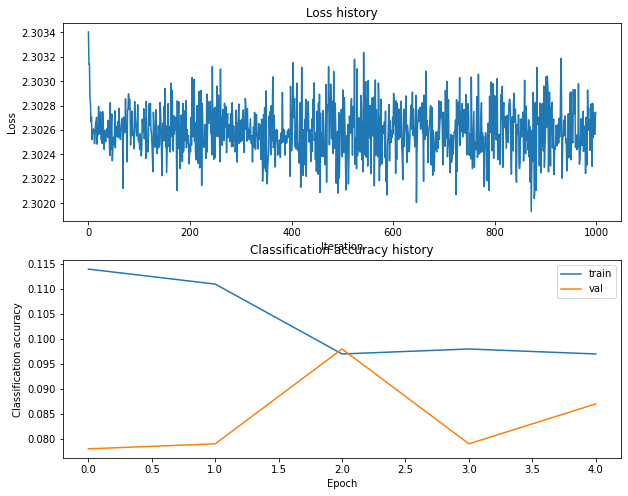

learning_rate 1.0
regularization_strength 1e-10


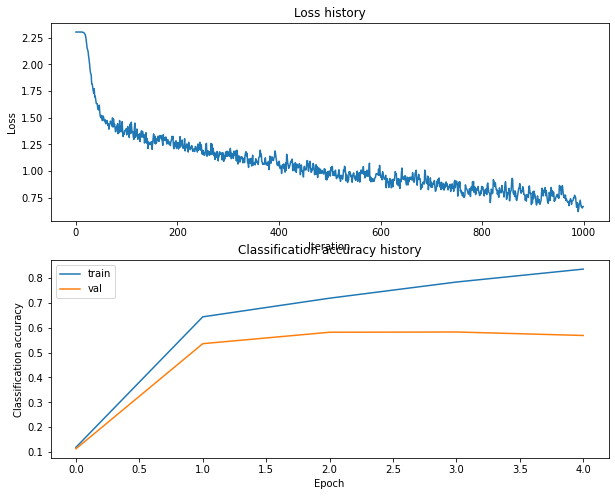

learning_rate 1.0
regularization_strength 1.2915496650148826e-09


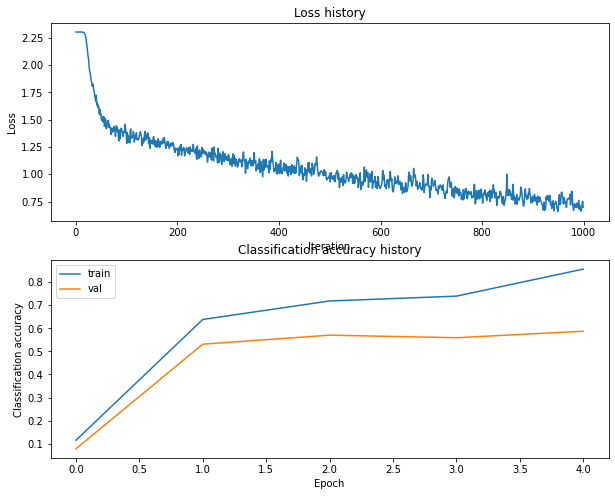

learning_rate 1.0
regularization_strength 1.6681005372000592e-08


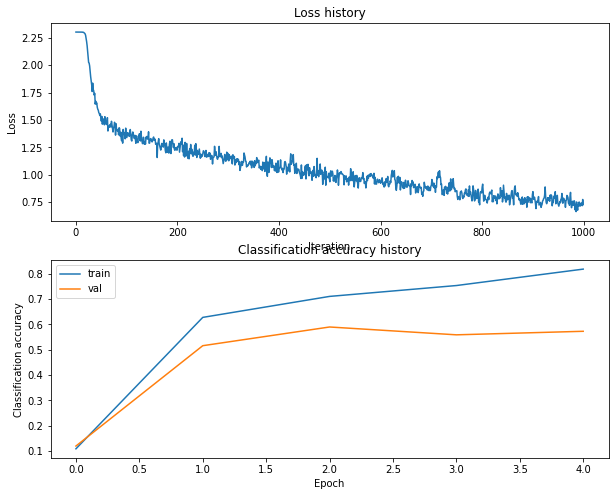

learning_rate 1.0
regularization_strength 2.1544346900318867e-07


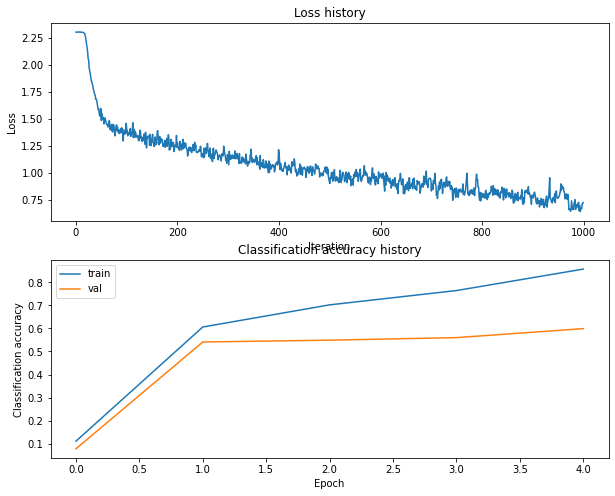

learning_rate 1.0
regularization_strength 2.782559402207126e-06


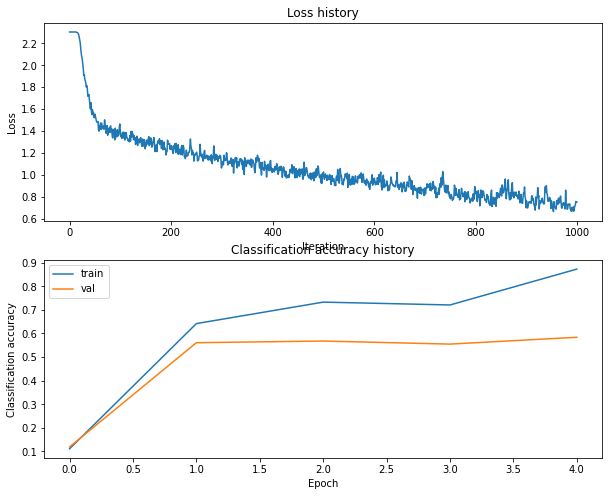

learning_rate 1.0
regularization_strength 3.5938136638046256e-05


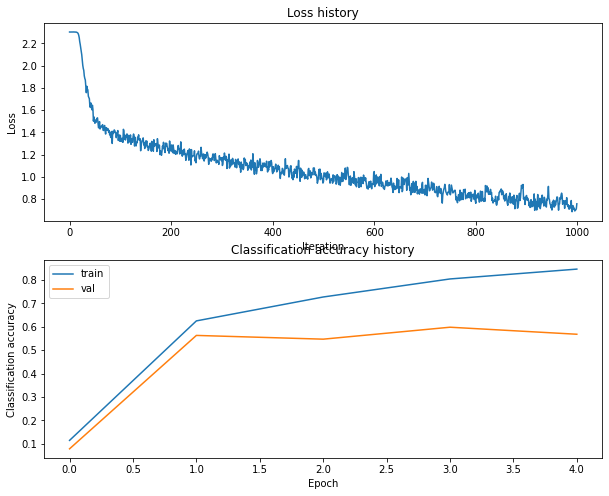

learning_rate 1.0
regularization_strength 0.0004641588833612782


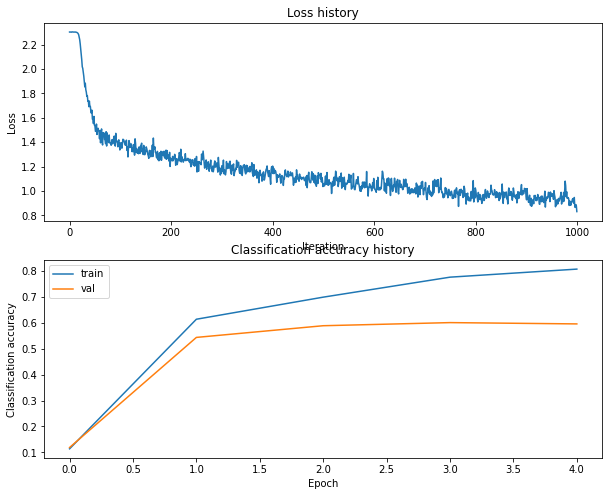

learning_rate 1.0
regularization_strength 0.005994842503189421


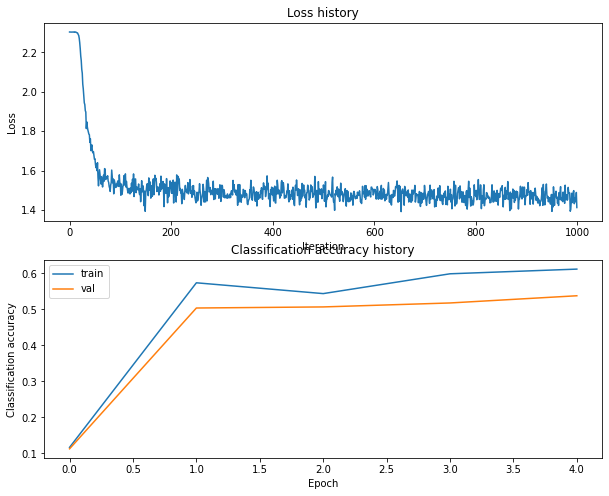

learning_rate 1.0
regularization_strength 0.07742636826811278


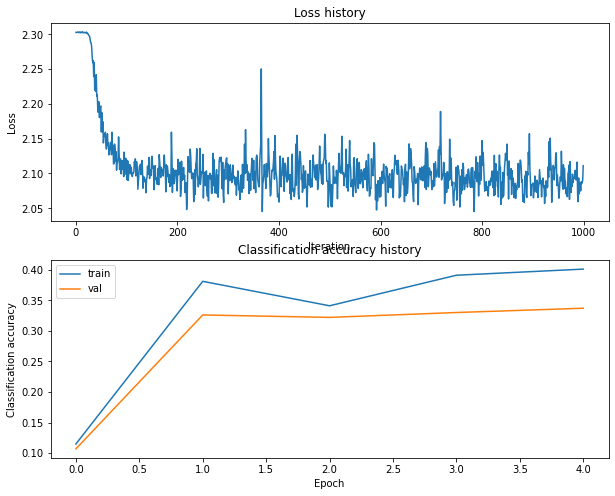

/content/cs231n/classifiers/neural_net.py:106: RuntimeWarning: divide by zero encountered in log
  loss = np.sum(-np.log(scores[correct_class_index]))
/content/cs231n/classifiers/neural_net.py:103: RuntimeWarning: overflow encountered in subtract
  scores -= np.amax(scores, axis=1)[:,np.newaxis]
/content/cs231n/classifiers/neural_net.py:84: RuntimeWarning: overflow encountered in matmul
  scores = np.matmul(a1, W2) + b2
/content/cs231n/classifiers/neural_net.py:103: RuntimeWarning: invalid value encountered in subtract
  scores -= np.amax(scores, axis=1)[:,np.newaxis]
/content/cs231n/classifiers/neural_net.py:129: RuntimeWarning: invalid value encountered in less_equal
  da1[z1<=0] = 0


learning_rate 1.0
regularization_strength 1.0


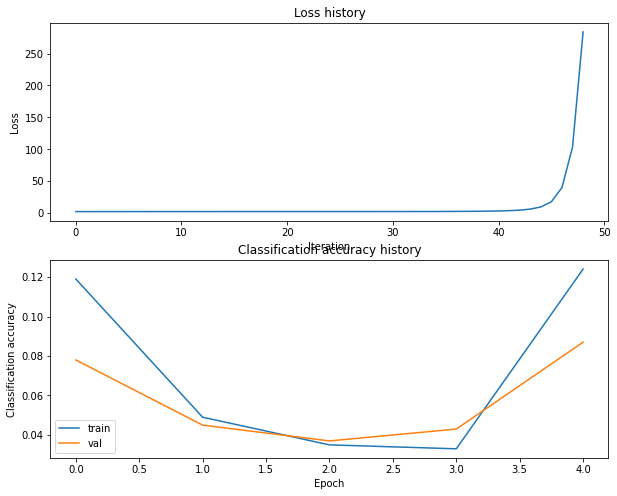

lr 1.000000e-10 reg 1.000000e-10 train accuracy: 0.102041 val accuracy: 0.105000
lr 1.000000e-10 reg 1.291550e-09 train accuracy: 0.090918 val accuracy: 0.089000
lr 1.000000e-10 reg 1.668101e-08 train accuracy: 0.084306 val accuracy: 0.082000
lr 1.000000e-10 reg 2.154435e-07 train accuracy: 0.084469 val accuracy: 0.085000
lr 1.000000e-10 reg 2.782559e-06 train accuracy: 0.105408 val accuracy: 0.097000
lr 1.000000e-10 reg 3.593814e-05 train accuracy: 0.099245 val accuracy: 0.093000
lr 1.000000e-10 reg 4.641589e-04 train accuracy: 0.095837 val accuracy: 0.109000
lr 1.000000e-10 reg 5.994843e-03 train accuracy: 0.075898 val accuracy: 0.081000
lr 1.000000e-10 reg 7.742637e-02 train accuracy: 0.088204 val accuracy: 0.094000
lr 1.000000e-10 reg 1.000000e+00 train accuracy: 0.090245 val accuracy: 0.088000
lr 1.291550e-09 reg 1.000000e-10 train accuracy: 0.102735 val accuracy: 0.099000
lr 1.291550e-09 reg 1.291550e-09 train accuracy: 0.111245 val accuracy: 0.107000
lr 1.291550e-09 reg 1.668101

In [0]:
from cs231n.classifiers.neural_net import TwoLayerNet

input_size = X_train_feats.shape[1]
hidden_size = 500

num_classes = 10

results = {}
best_net = None
best_val = -1
best_learning_rate = None
best_reg = None 
best_stast = None

################################################################################
# TODO: Train a two-layer neural network on image features. You may want to    #
# cross-validate various parameters as in previous sections. Store your best   #
# model in the best_net variable.                                              #
################################################################################
# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

learning_rates = np.logspace(-10,0,10)
regularization_strengths = np.logspace(-10,0,10)

for learning_rate in learning_rates:
    for regularization_strength in regularization_strengths:
        net = TwoLayerNet(input_size, hidden_size, num_classes)

        # Train the network
        stats = net.train(X_train_feats, y_train, X_val_feats, y_val,
                    num_iters=1000, batch_size=200,
                    learning_rate=learning_rate, learning_rate_decay=0.95,
                    reg=regularization_strength)

        y_train_pred = net.predict(X_train_feats)
        training_accuracy = np.mean(y_train == y_train_pred)
        y_val_pred = net.predict(X_val_feats)
        validation_accuracy = np.mean(y_val == y_val_pred)

        if validation_accuracy > best_val:
            best_val = validation_accuracy
            best_net = net
            best_learning_rate = learning_rate
            best_reg = regularization_strength

        results[(learning_rate,regularization_strength)] = (training_accuracy, 
                                                            validation_accuracy)
        
        print("learning_rate", learning_rate)
        print("regularization_strength", regularization_strength)
        plt.figure()
        plt.subplot(2, 1, 1)
        plt.plot(stats['loss_history'])
        plt.title('Loss history')
        plt.xlabel('Iteration')
        plt.ylabel('Loss')

        plt.subplot(2, 1, 2)
        plt.plot(stats['train_acc_history'], label='train')
        plt.plot(stats['val_acc_history'], label='val')
        plt.title('Classification accuracy history')
        plt.xlabel('Epoch')
        plt.ylabel('Classification accuracy')
        plt.legend()
        plt.show()  
# Print out results.
for lr, reg in sorted(results):
    train_accuracy, val_accuracy = results[(lr, reg)]
    print('lr %e reg %e train accuracy: %f val accuracy: %f' % (
                lr, reg, train_accuracy, val_accuracy))
    
print("best learning rate:", best_learning_rate)
print("best regularization strength:", best_reg)
print('best validation accuracy achieved during cross-validation: %f' % best_val)
# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


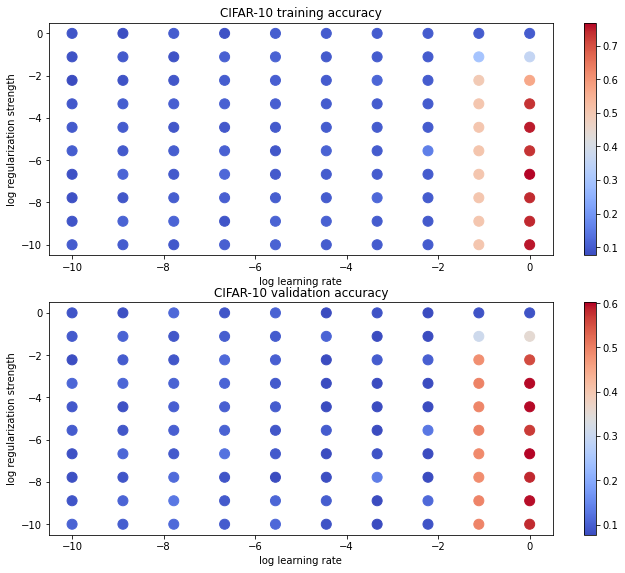

In [0]:
# Visualize the cross-validation results
import math
import pdb

# pdb.set_trace()

x_scatter = [math.log10(x[0]) for x in results]
y_scatter = [math.log10(x[1]) for x in results]

# plot training accuracy
marker_size = 100
colors = [results[x][0] for x in results]
plt.subplot(2, 1, 1)
plt.tight_layout(pad=3)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors, cmap=plt.cm.coolwarm)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 training accuracy')

# plot validation accuracy
colors = [results[x][1] for x in results] # default size of markers is 20
plt.subplot(2, 1, 2)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors, cmap=plt.cm.coolwarm)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 validation accuracy')
plt.show()

learning_rate 0.01
regularization_strength 1e-09


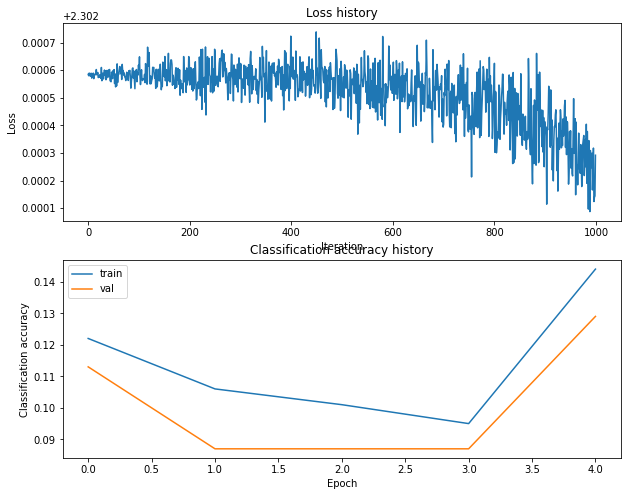

learning_rate 0.01
regularization_strength 1e-08


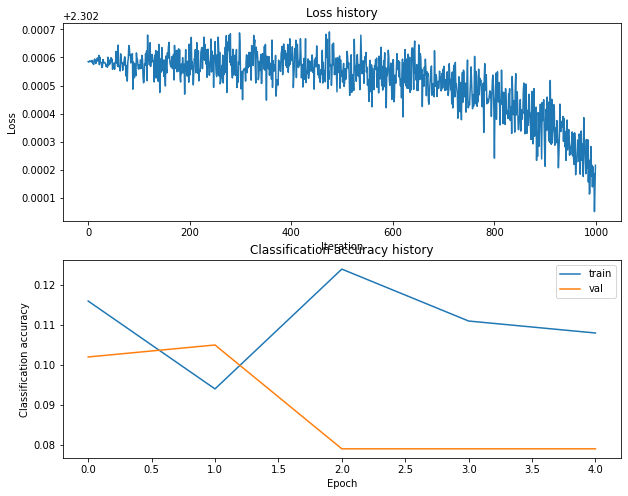

learning_rate 0.01
regularization_strength 1e-07


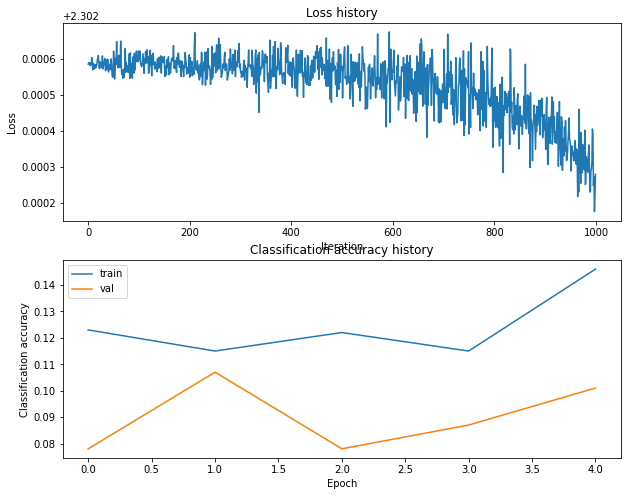

learning_rate 0.01
regularization_strength 1e-06


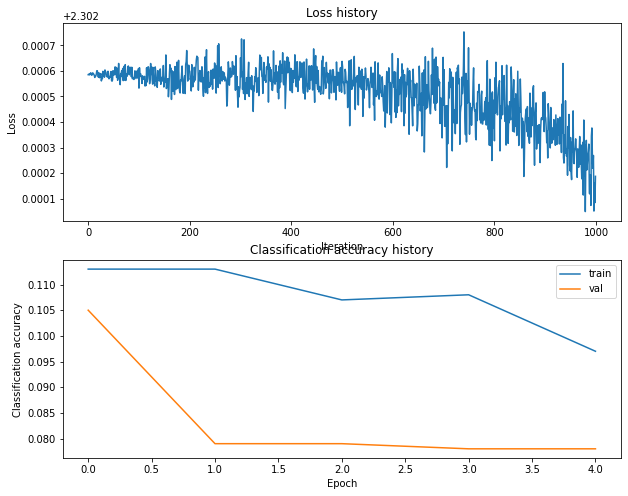

learning_rate 0.01
regularization_strength 1e-05


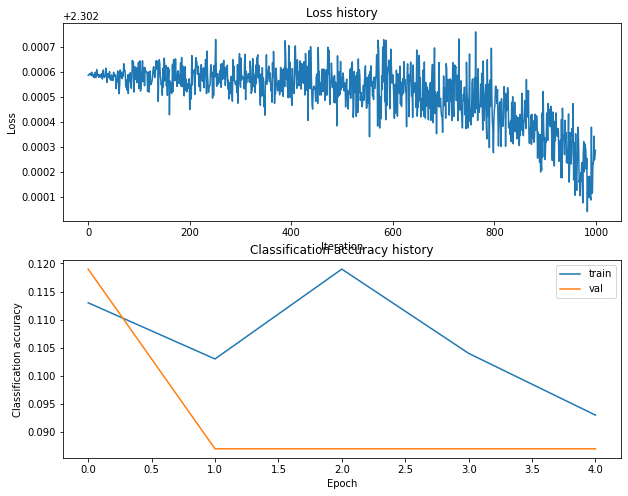

learning_rate 0.03162277660168379
regularization_strength 1e-09


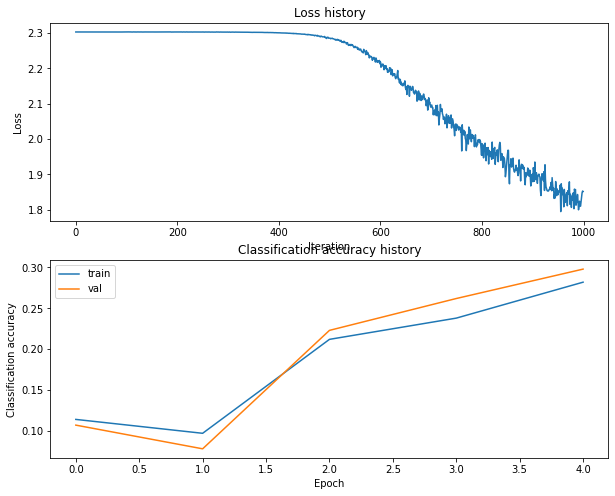

learning_rate 0.03162277660168379
regularization_strength 1e-08


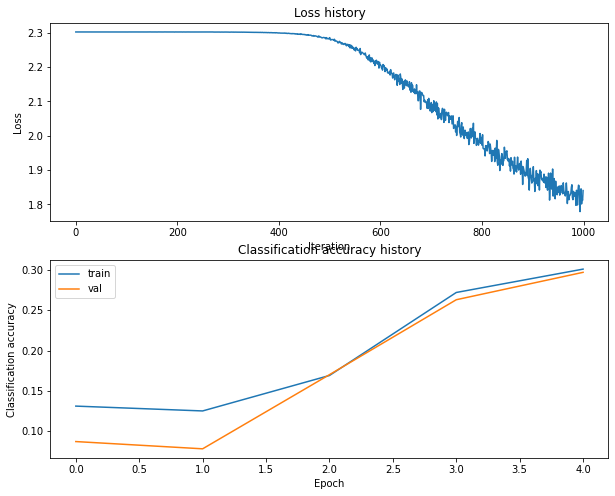

learning_rate 0.03162277660168379
regularization_strength 1e-07


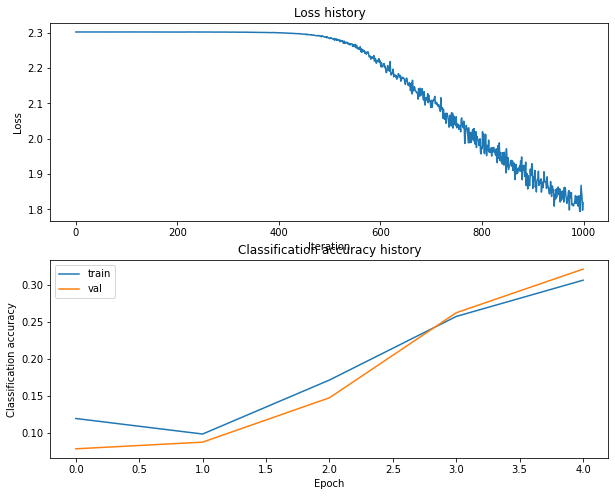

learning_rate 0.03162277660168379
regularization_strength 1e-06


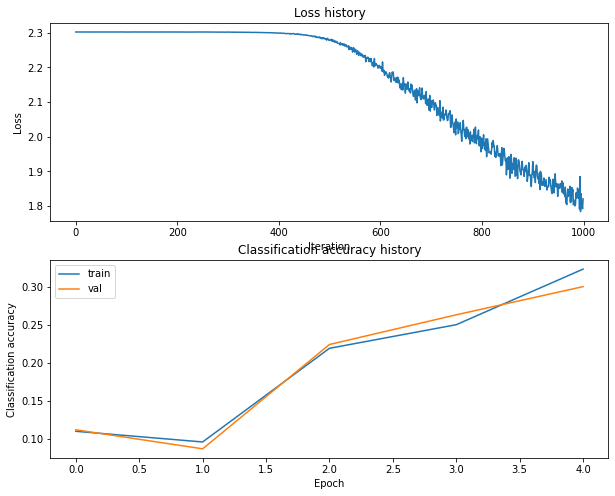

learning_rate 0.03162277660168379
regularization_strength 1e-05


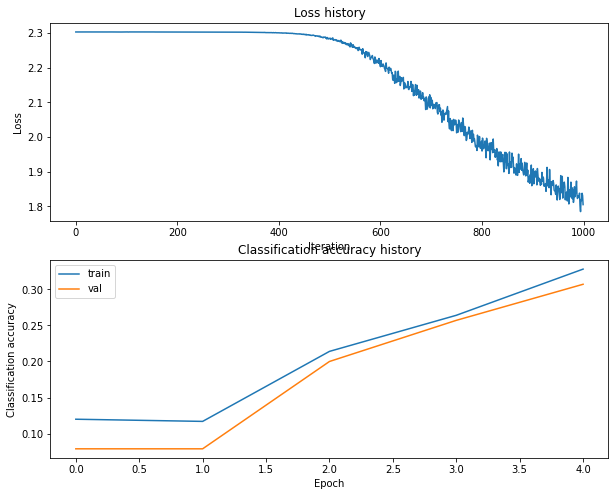

learning_rate 0.1
regularization_strength 1e-09


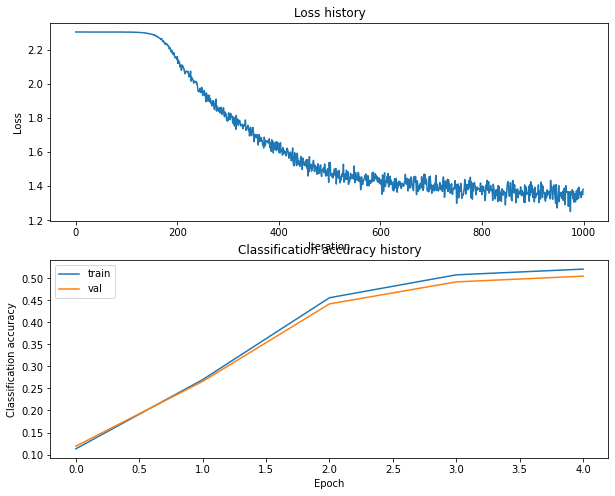

learning_rate 0.1
regularization_strength 1e-08


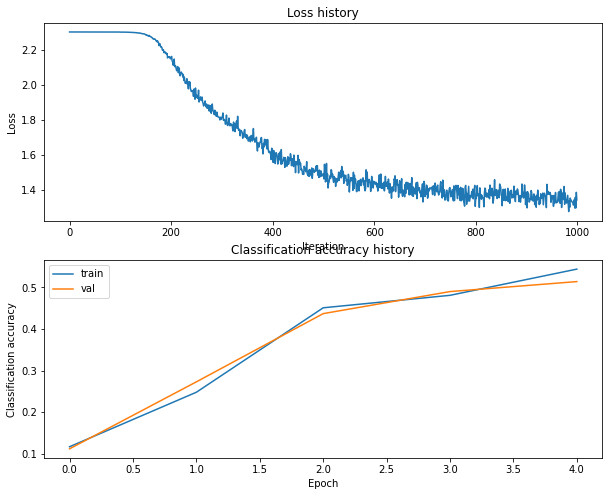

learning_rate 0.1
regularization_strength 1e-07


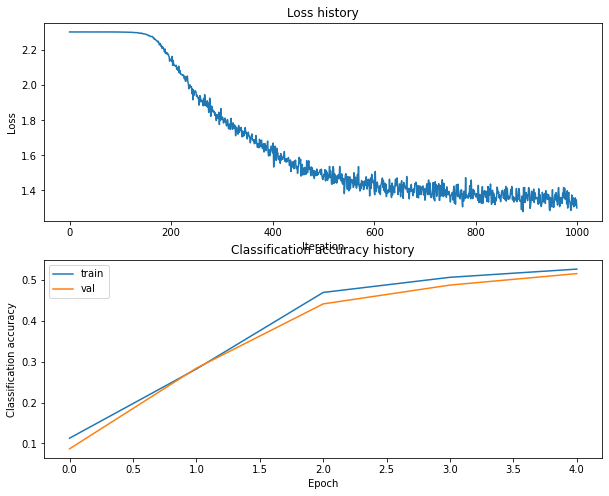

learning_rate 0.1
regularization_strength 1e-06


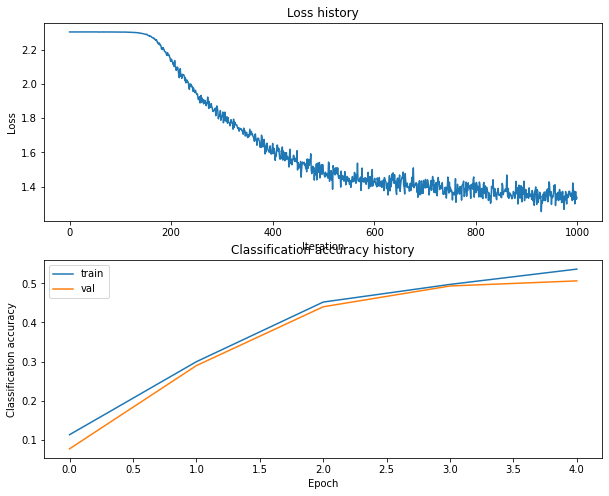

learning_rate 0.1
regularization_strength 1e-05


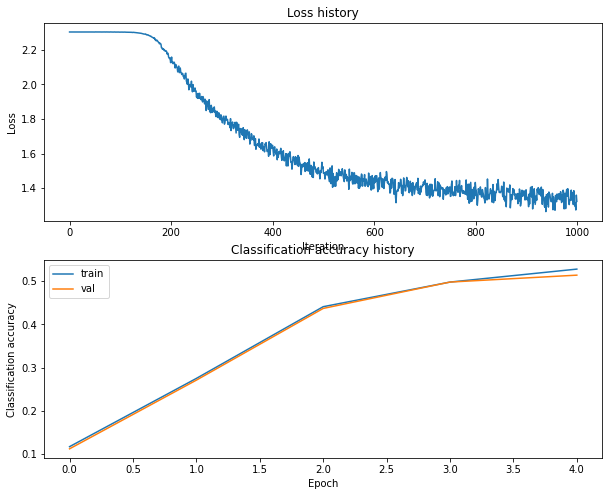

learning_rate 0.31622776601683794
regularization_strength 1e-09


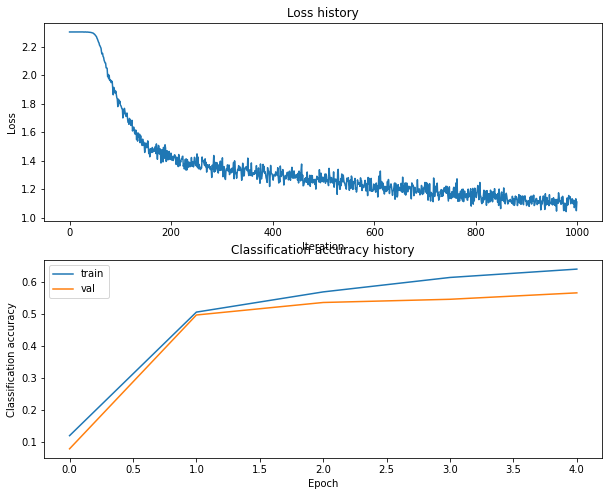

learning_rate 0.31622776601683794
regularization_strength 1e-08


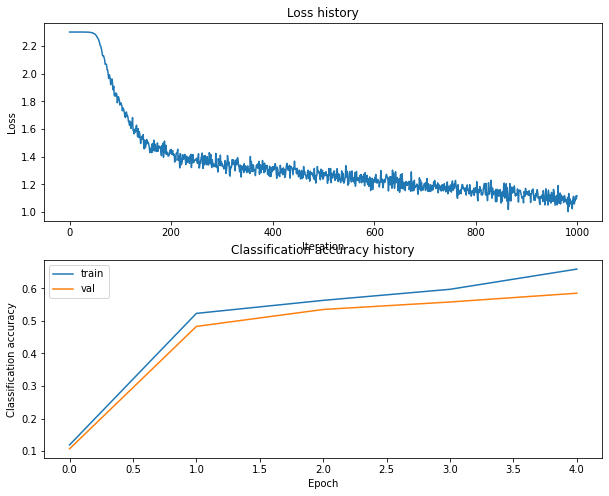

learning_rate 0.31622776601683794
regularization_strength 1e-07


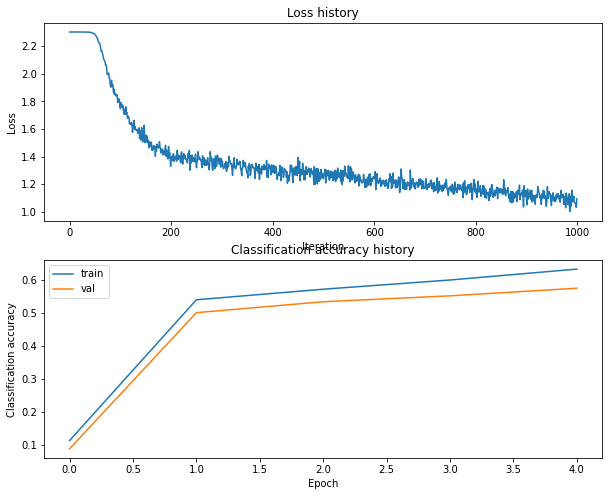

learning_rate 0.31622776601683794
regularization_strength 1e-06


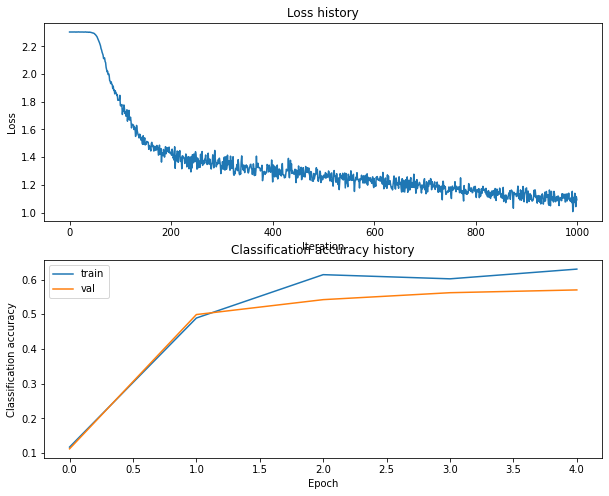

learning_rate 0.31622776601683794
regularization_strength 1e-05


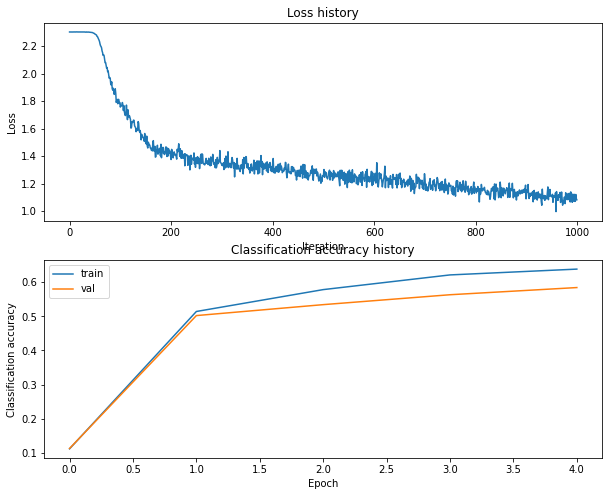

learning_rate 1.0
regularization_strength 1e-09


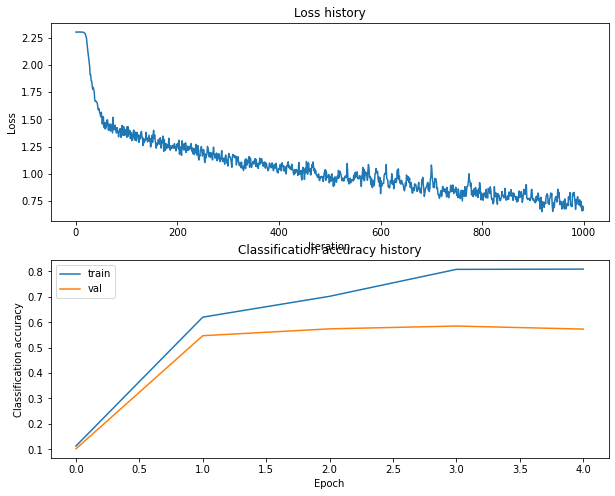

learning_rate 1.0
regularization_strength 1e-08


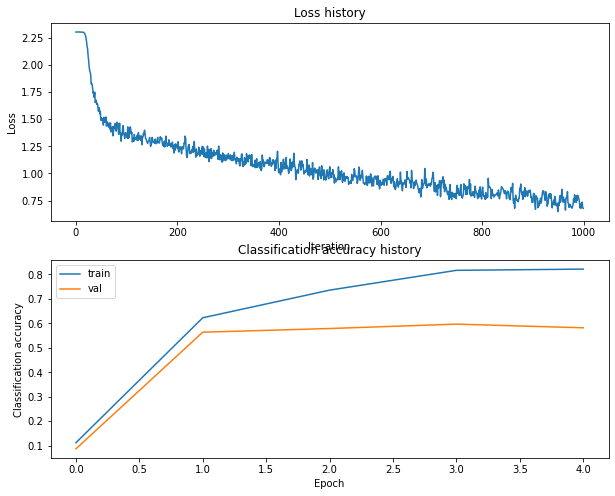

learning_rate 1.0
regularization_strength 1e-07


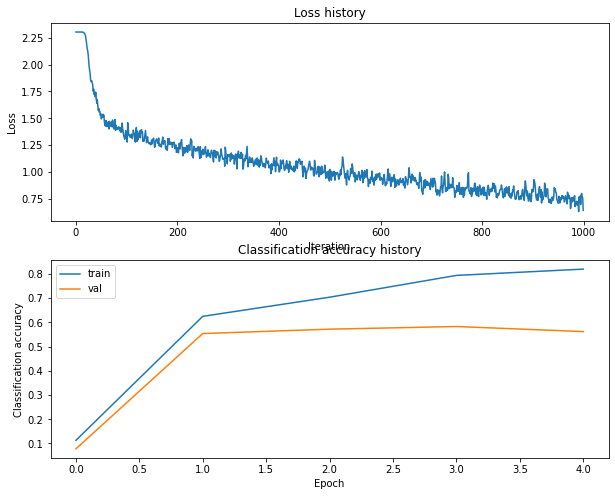

learning_rate 1.0
regularization_strength 1e-06


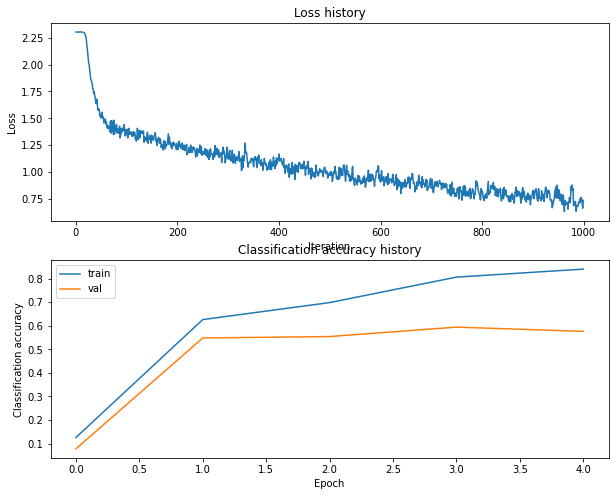

learning_rate 1.0
regularization_strength 1e-05


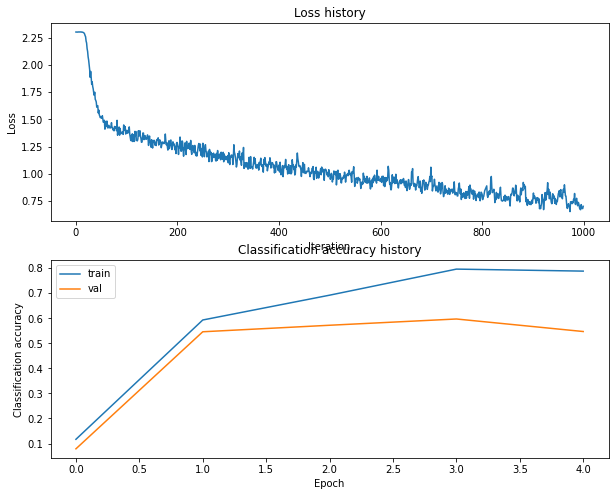

learning_rate 3.1622776601683795
regularization_strength 1e-09


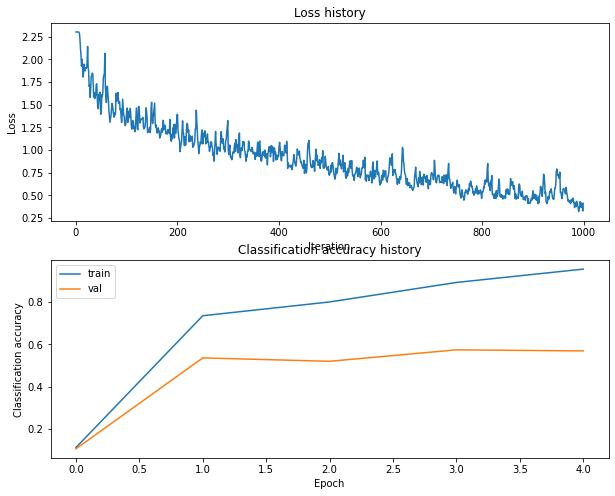

learning_rate 3.1622776601683795
regularization_strength 1e-08


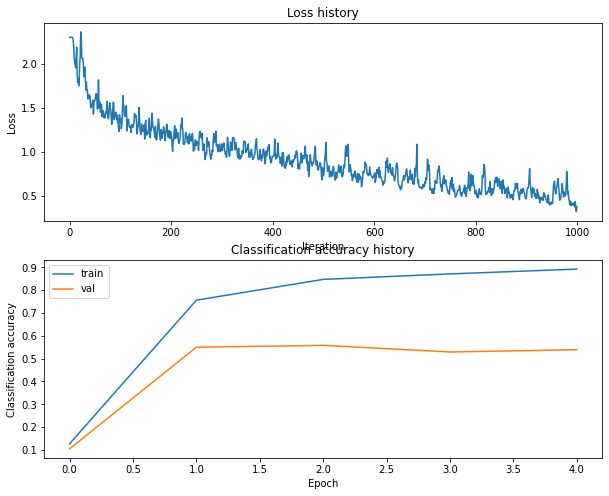

learning_rate 3.1622776601683795
regularization_strength 1e-07


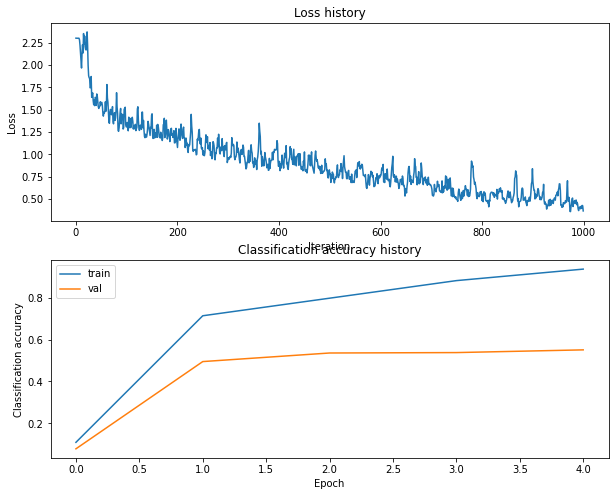

learning_rate 3.1622776601683795
regularization_strength 1e-06


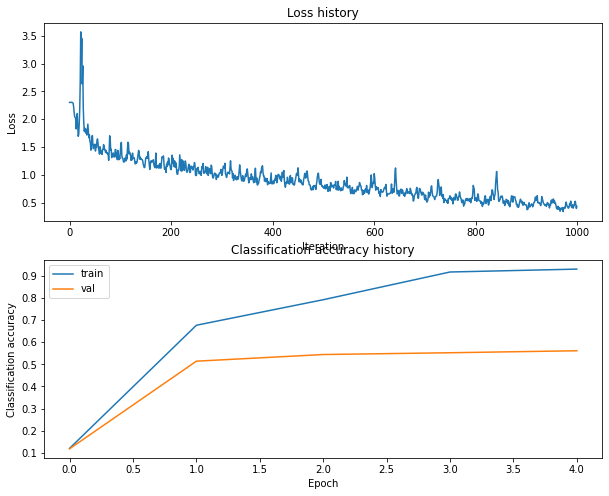

learning_rate 3.1622776601683795
regularization_strength 1e-05


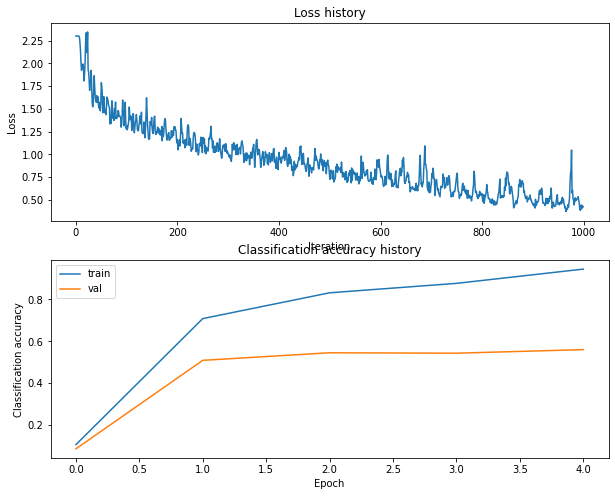

/content/cs231n/classifiers/neural_net.py:106: RuntimeWarning: divide by zero encountered in log
  loss = np.sum(-np.log(scores[correct_class_index]))
/content/cs231n/classifiers/neural_net.py:84: RuntimeWarning: overflow encountered in matmul
  scores = np.matmul(a1, W2) + b2
/content/cs231n/classifiers/neural_net.py:103: RuntimeWarning: overflow encountered in subtract
  scores -= np.amax(scores, axis=1)[:,np.newaxis]
/content/cs231n/classifiers/neural_net.py:103: RuntimeWarning: invalid value encountered in subtract
  scores -= np.amax(scores, axis=1)[:,np.newaxis]
/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:90: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/content/cs231n/classifiers/neural_net.py:129: RuntimeWarning: invalid value encountered in less_equal
  da1[z1<=0] = 0


learning_rate 10.0
regularization_strength 1e-09


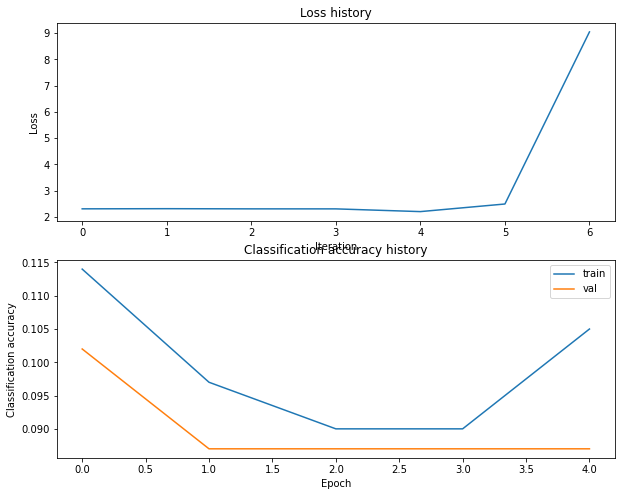

learning_rate 10.0
regularization_strength 1e-08


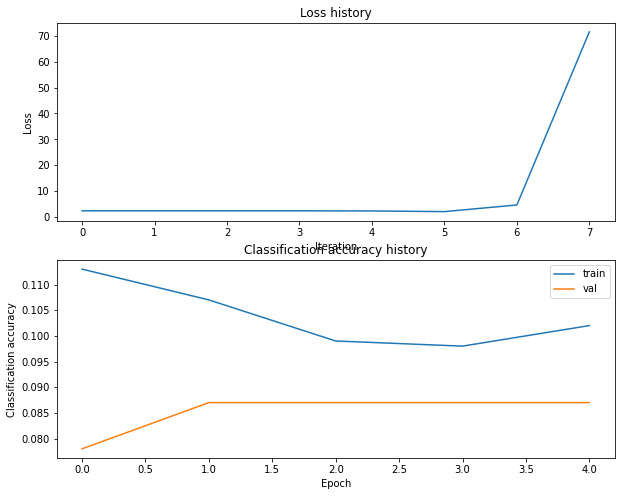

/content/cs231n/classifiers/neural_net.py:109: RuntimeWarning: overflow encountered in multiply
  loss += reg * (np.sum(W1*W1) +  np.sum(W2*W2))


learning_rate 10.0
regularization_strength 1e-07


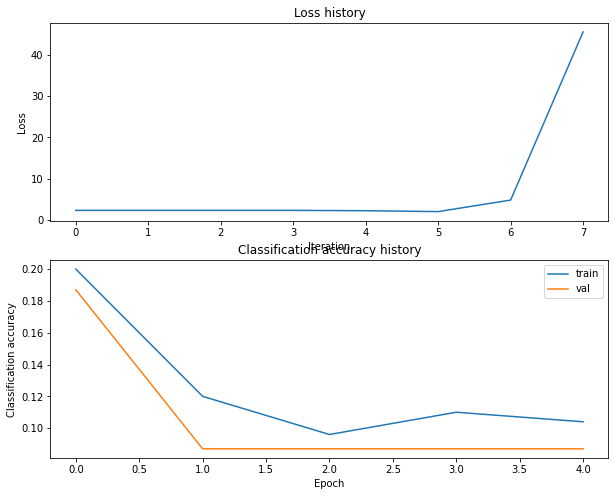

learning_rate 10.0
regularization_strength 1e-06


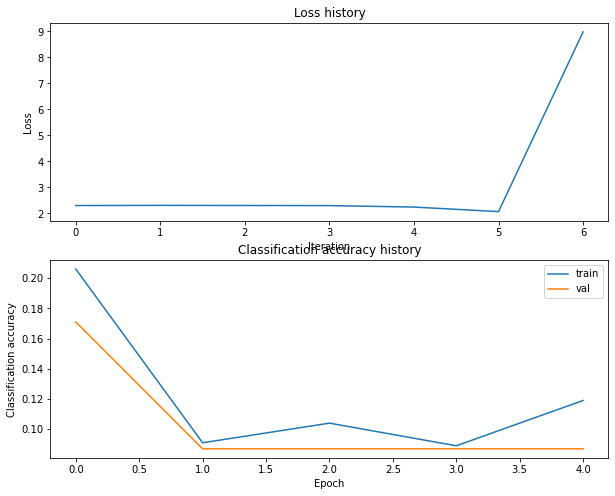

learning_rate 10.0
regularization_strength 1e-05


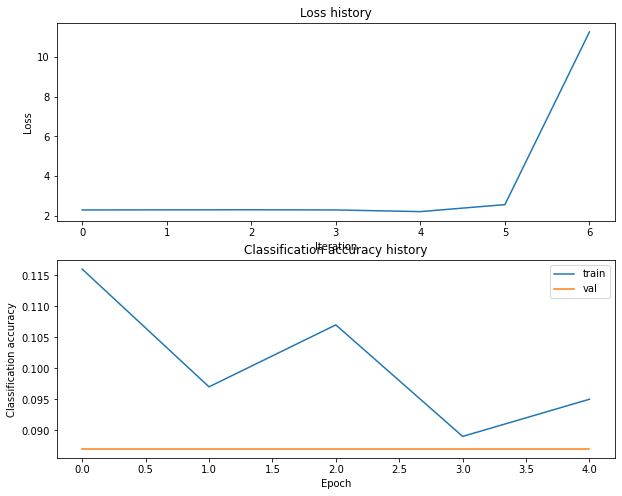

learning_rate 31.622776601683793
regularization_strength 1e-09


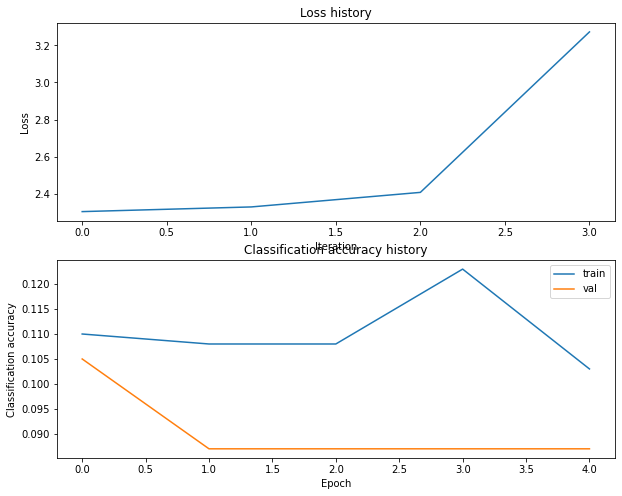

learning_rate 31.622776601683793
regularization_strength 1e-08


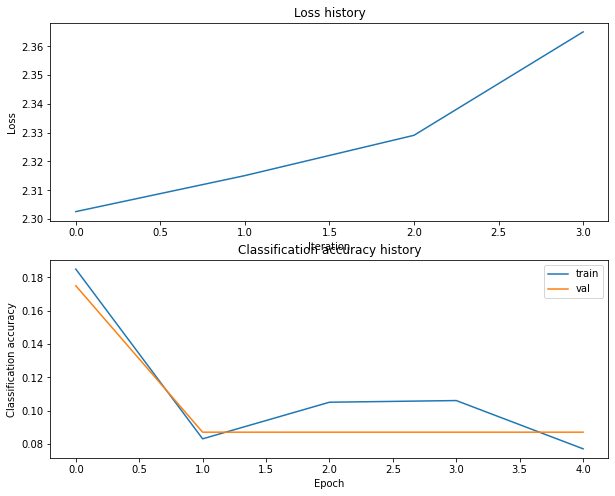

learning_rate 31.622776601683793
regularization_strength 1e-07


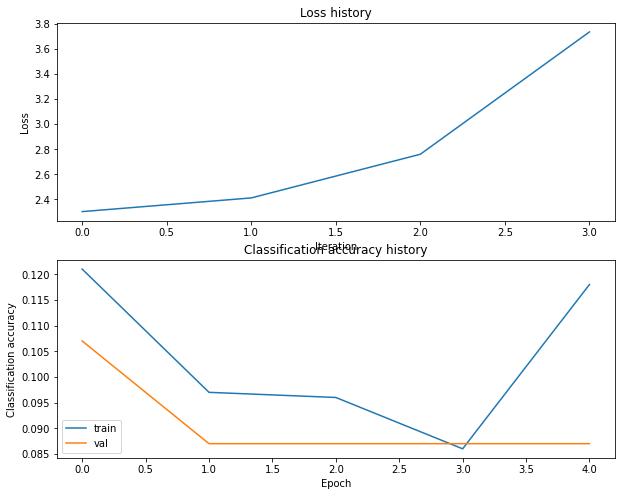

/content/cs231n/classifiers/neural_net.py:84: RuntimeWarning: invalid value encountered in matmul
  scores = np.matmul(a1, W2) + b2


learning_rate 31.622776601683793
regularization_strength 1e-06


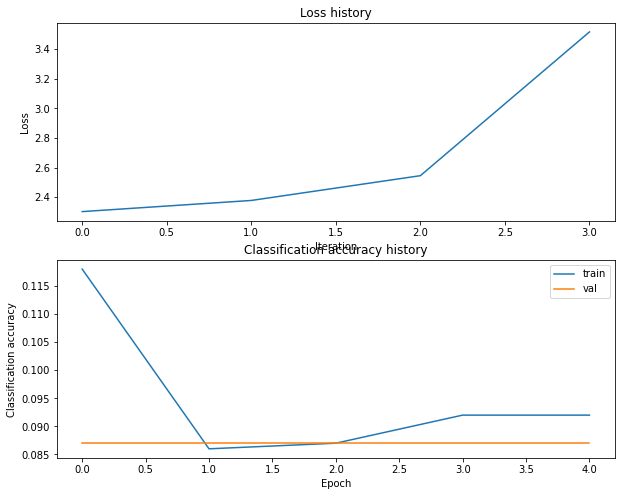

learning_rate 31.622776601683793
regularization_strength 1e-05


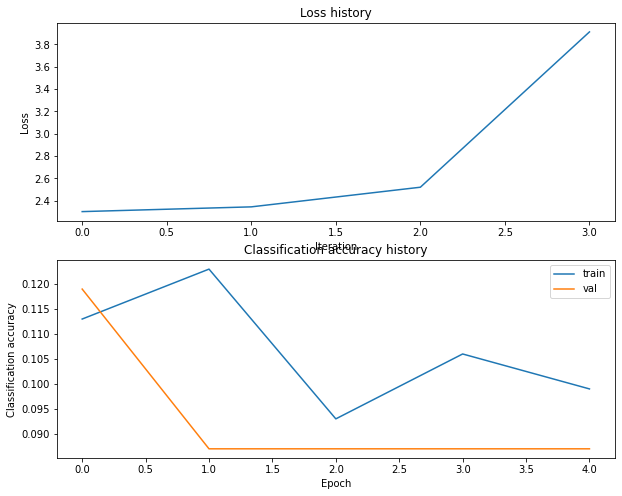

learning_rate 100.0
regularization_strength 1e-09


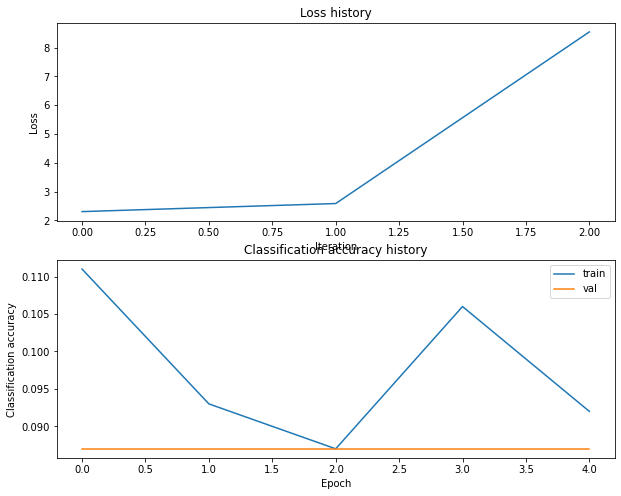

learning_rate 100.0
regularization_strength 1e-08


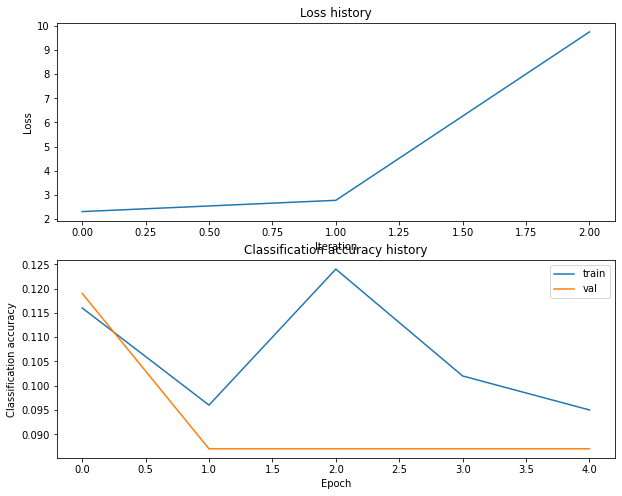

learning_rate 100.0
regularization_strength 1e-07


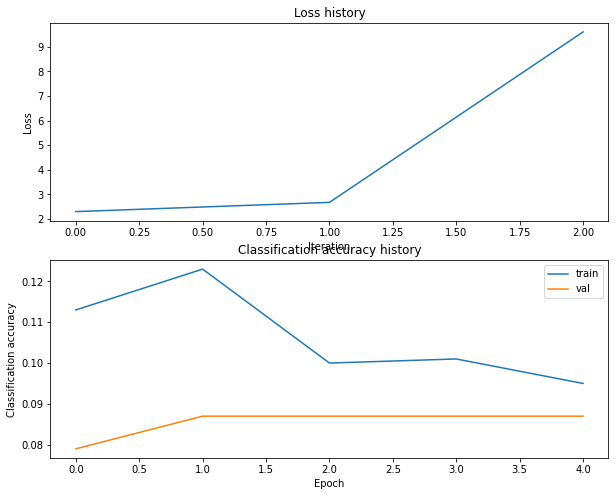

learning_rate 100.0
regularization_strength 1e-06


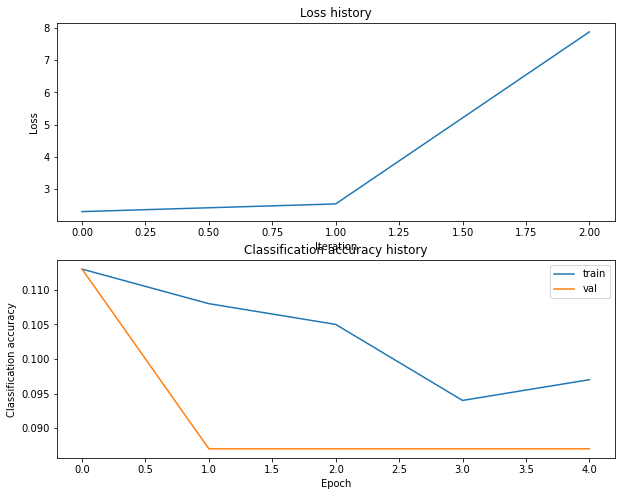

learning_rate 100.0
regularization_strength 1e-05


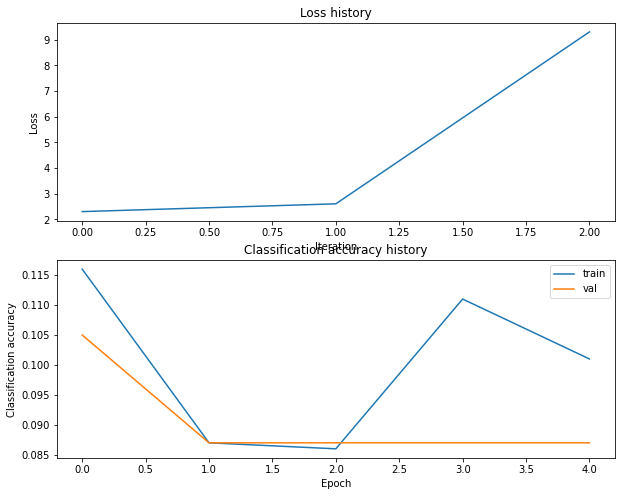

lr 1.000000e-02 reg 1.000000e-09 train accuracy: 0.150388 val accuracy: 0.125000
lr 1.000000e-02 reg 1.000000e-08 train accuracy: 0.100429 val accuracy: 0.079000
lr 1.000000e-02 reg 1.000000e-07 train accuracy: 0.160245 val accuracy: 0.130000
lr 1.000000e-02 reg 1.000000e-06 train accuracy: 0.100449 val accuracy: 0.078000
lr 1.000000e-02 reg 1.000000e-05 train accuracy: 0.156898 val accuracy: 0.129000
lr 3.162278e-02 reg 1.000000e-09 train accuracy: 0.307082 val accuracy: 0.304000
lr 3.162278e-02 reg 1.000000e-08 train accuracy: 0.309122 val accuracy: 0.306000
lr 3.162278e-02 reg 1.000000e-07 train accuracy: 0.316612 val accuracy: 0.319000
lr 3.162278e-02 reg 1.000000e-06 train accuracy: 0.309327 val accuracy: 0.303000
lr 3.162278e-02 reg 1.000000e-05 train accuracy: 0.310816 val accuracy: 0.324000
lr 1.000000e-01 reg 1.000000e-09 train accuracy: 0.528388 val accuracy: 0.503000
lr 1.000000e-01 reg 1.000000e-08 train accuracy: 0.525714 val accuracy: 0.507000
lr 1.000000e-01 reg 1.000000

In [0]:
# Fine tuning
from cs231n.classifiers.neural_net import TwoLayerNet

input_size = X_train_feats.shape[1]
hidden_size = 500

num_classes = 10

results = {}
best_net = None
best_val = -1
best_learning_rate = None
best_reg = None 
best_stast = None

################################################################################
# TODO: Train a two-layer neural network on image features. You may want to    #
# cross-validate various parameters as in previous sections. Store your best   #
# model in the best_net variable.                                              #
################################################################################
# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

learning_rates = np.logspace(-2,2,9)
regularization_strengths = np.logspace(-9,-5,5)

for learning_rate in learning_rates:
    for regularization_strength in regularization_strengths:
        net = TwoLayerNet(input_size, hidden_size, num_classes)

        # Train the network
        stats = net.train(X_train_feats, y_train, X_val_feats, y_val,
                    num_iters=1000, batch_size=200,
                    learning_rate=learning_rate, learning_rate_decay=0.95,
                    reg=regularization_strength)

        y_train_pred = net.predict(X_train_feats)
        training_accuracy = np.mean(y_train == y_train_pred)
        y_val_pred = net.predict(X_val_feats)
        validation_accuracy = np.mean(y_val == y_val_pred)

        if validation_accuracy > best_val:
            best_val = validation_accuracy
            best_net = net
            best_learning_rate = learning_rate
            best_reg = regularization_strength

        results[(learning_rate,regularization_strength)] = (training_accuracy, 
                                                            validation_accuracy)
        
        print("learning_rate", learning_rate)
        print("regularization_strength", regularization_strength)
        plt.figure()
        plt.subplot(2, 1, 1)
        plt.plot(stats['loss_history'])
        plt.title('Loss history')
        plt.xlabel('Iteration')
        plt.ylabel('Loss')

        plt.subplot(2, 1, 2)
        plt.plot(stats['train_acc_history'], label='train')
        plt.plot(stats['val_acc_history'], label='val')
        plt.title('Classification accuracy history')
        plt.xlabel('Epoch')
        plt.ylabel('Classification accuracy')
        plt.legend()
        plt.show()  
# Print out results.
for lr, reg in sorted(results):
    train_accuracy, val_accuracy = results[(lr, reg)]
    print('lr %e reg %e train accuracy: %f val accuracy: %f' % (
                lr, reg, train_accuracy, val_accuracy))
    
print("best learning rate:", best_learning_rate)
print("best regularization strength:", best_reg)
print('best validation accuracy achieved during cross-validation: %f' % best_val)
# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


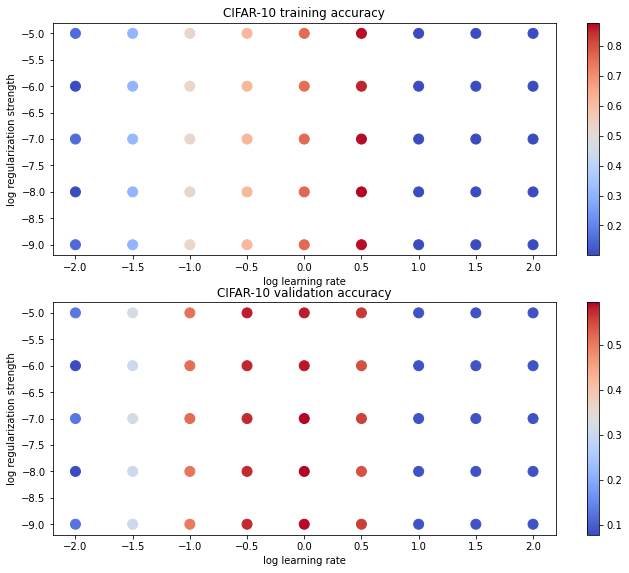

In [0]:
# Visualize the cross-validation results
import math
import pdb

# pdb.set_trace()

x_scatter = [math.log10(x[0]) for x in results]
y_scatter = [math.log10(x[1]) for x in results]

# plot training accuracy
marker_size = 100
colors = [results[x][0] for x in results]
plt.subplot(2, 1, 1)
plt.tight_layout(pad=3)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors, cmap=plt.cm.coolwarm)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 training accuracy')

# plot validation accuracy
colors = [results[x][1] for x in results] # default size of markers is 20
plt.subplot(2, 1, 2)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors, cmap=plt.cm.coolwarm)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 validation accuracy')
plt.show()

In [0]:
# Run your best neural net classifier on the test set. You should be able
# to get more than 55% accuracy.
test_acc = (best_net.predict(X_test_feats) == y_test).mean()
print(test_acc)

0.574


---
# IMPORTANT

This is the end of this question. Please do the following:

1. Click `File -> Save` to make sure the latest checkpoint of this notebook is saved to your Drive.
2. Execute the cell below to download the modified `.py` files back to your drive.

In [0]:
import os

FOLDER_TO_SAVE = os.path.join('drive/My Drive/', FOLDERNAME)
FILES_TO_SAVE = []

for files in FILES_TO_SAVE:
  with open(os.path.join(FOLDER_TO_SAVE, '/'.join(files.split('/')[1:])), 'w') as f:
    f.write(''.join(open(files).readlines()))